In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import warnings
warnings.filterwarnings('ignore')


In [3]:
df = pd.read_csv('/content/diabetes_data.csv')

In [4]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [5]:
df.tail()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1
767,1,93,70,31,0,30.4,0.315,23,0


In [6]:
df.shape

(768, 9)

In [7]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [8]:
df.duplicated().sum()

0

In [9]:
df.isnull().sum()

,0
Pregnancies,0
Glucose,0
BloodPressure,0
SkinThickness,0
Insulin,0
BMI,0
DiabetesPedigreeFunction,0
Age,0
Outcome,0


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [11]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [12]:
df.nunique()

,0
Pregnancies,17
Glucose,136
BloodPressure,47
SkinThickness,51
Insulin,186
BMI,248
DiabetesPedigreeFunction,517
Age,52
Outcome,2


In [13]:
object_columns = df.select_dtypes(include=['object']).columns
print("Object type columns:")
print(object_columns)

numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
print("\nNumerical type columns:")
print(numerical_columns)

Object type columns:
Index([], dtype='object')

Numerical type columns:
Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')


In [14]:
def classify_features(df):
    categorical_features = []
    non_categorical_features = []
    discrete_features = []
    continuous_features = []

    for column in df.columns:
        if df[column].dtype == 'object':
            if df[column].nunique() < 20:
                categorical_features.append(column)
            else:
                non_categorical_features.append(column)
        elif df[column].dtype in ['int64', 'float64']:
            if df[column].nunique() < 10:
                discrete_features.append(column)
            else:
                continuous_features.append(column)

    return categorical_features, non_categorical_features, discrete_features, continuous_features

In [15]:
categorical, non_categorical, discrete, continuous = classify_features(df)

In [16]:
print("Categorical Features:", categorical)
print("Non-Categorical Features:", non_categorical)
print("Discrete Features:", discrete)
print("Continuous Features:", continuous)

Categorical Features: []
Non-Categorical Features: []
Discrete Features: ['Outcome']
Continuous Features: ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']


In [17]:
df['Outcome'].unique()

array([1, 0])

In [18]:
df['Outcome'].value_counts()

,count
Outcome,
0,500
1,268


#Data Visualization

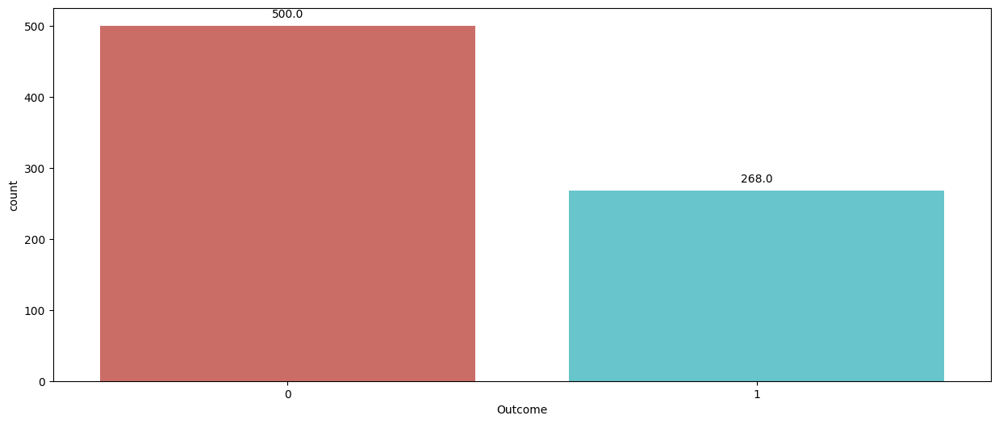

In [19]:
for i in discrete:
    plt.figure(figsize=(15, 6))
    ax = sns.countplot(x=i, data=df, palette='hls')

    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height}',
                    xy=(p.get_x() + p.get_width() / 2., height),
                    xytext=(0, 10),
                    textcoords='offset points',
                    ha='center', va='center')

    plt.show()

In [20]:
import plotly.express as px

for i in discrete:
    counts = df[i].value_counts()
    fig = px.pie(counts, values=counts.values, names=counts.index, title=f'Distribution of {i}')
    fig.show()

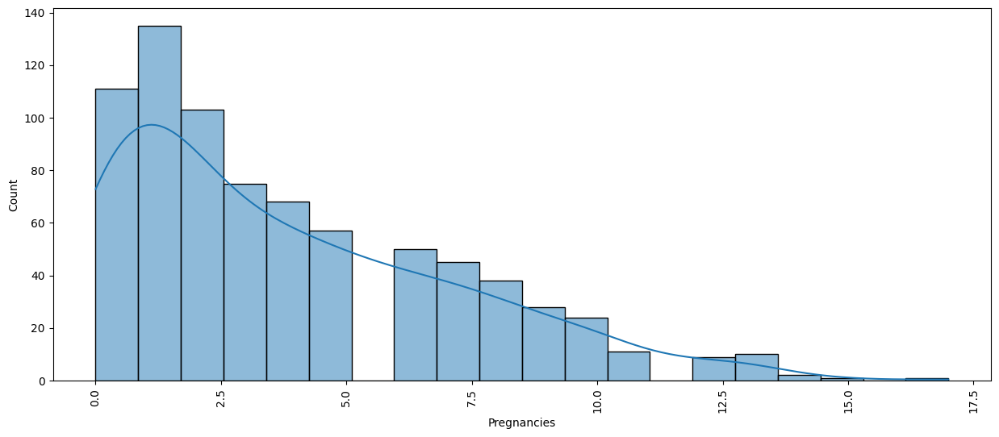

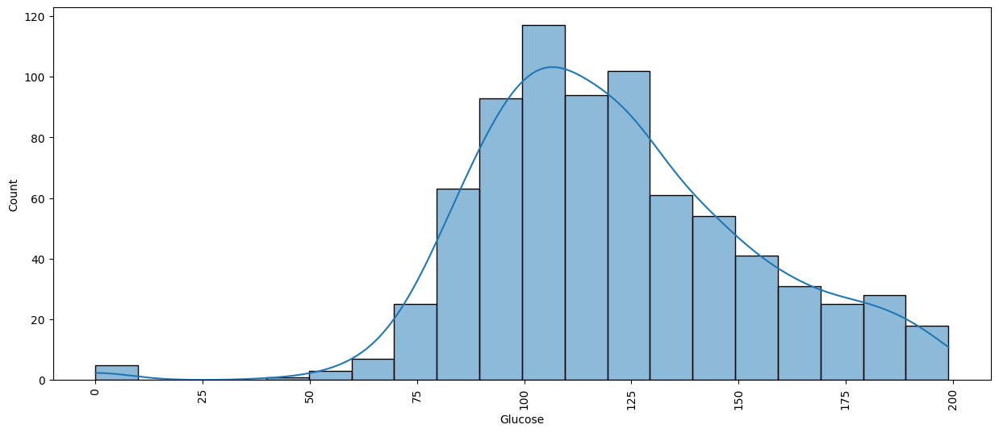

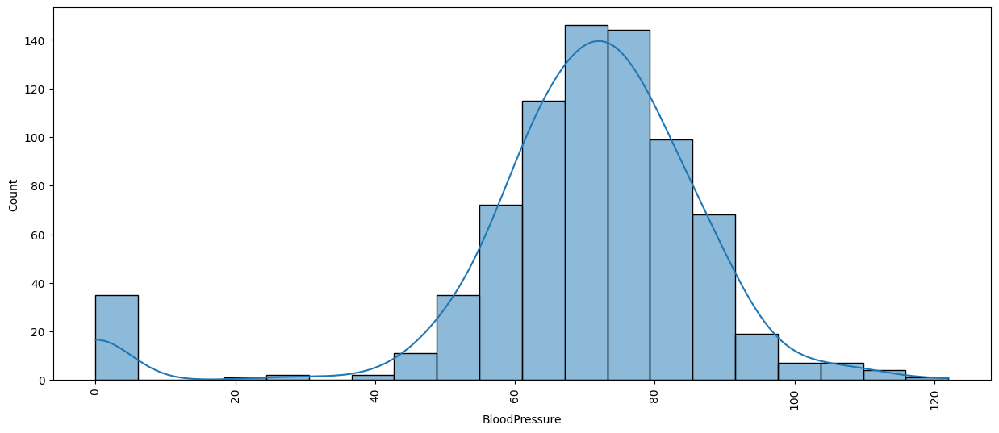

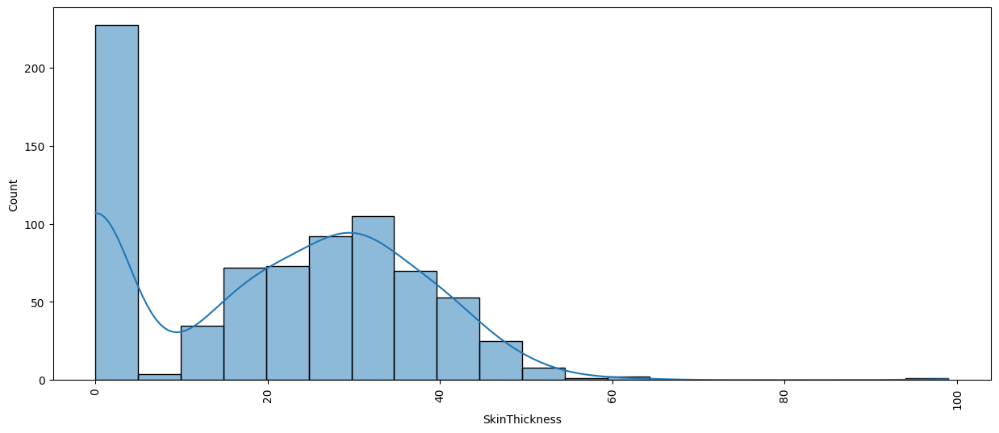

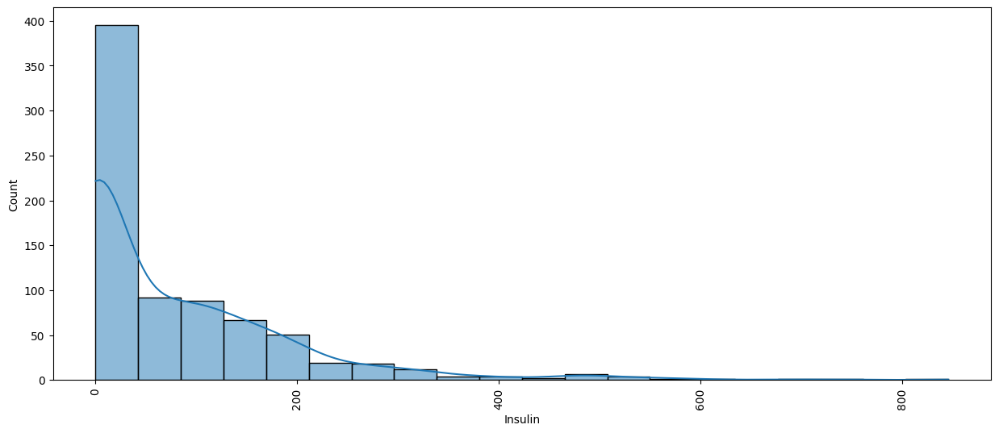

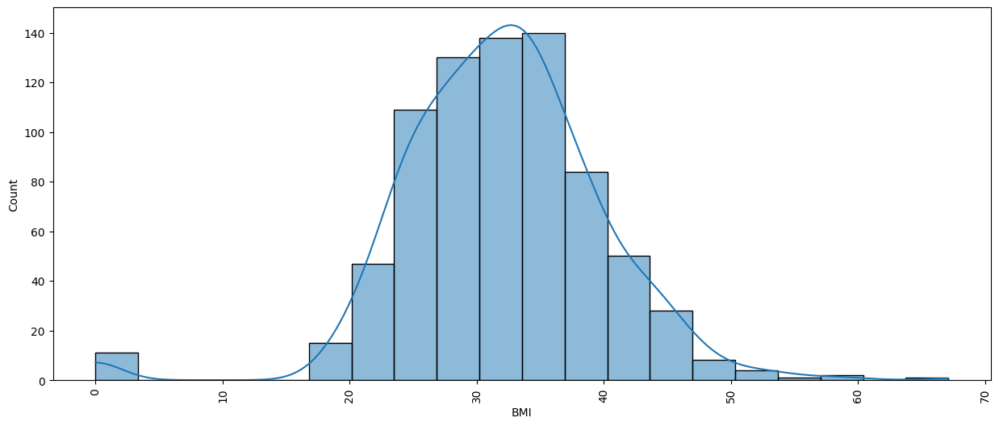

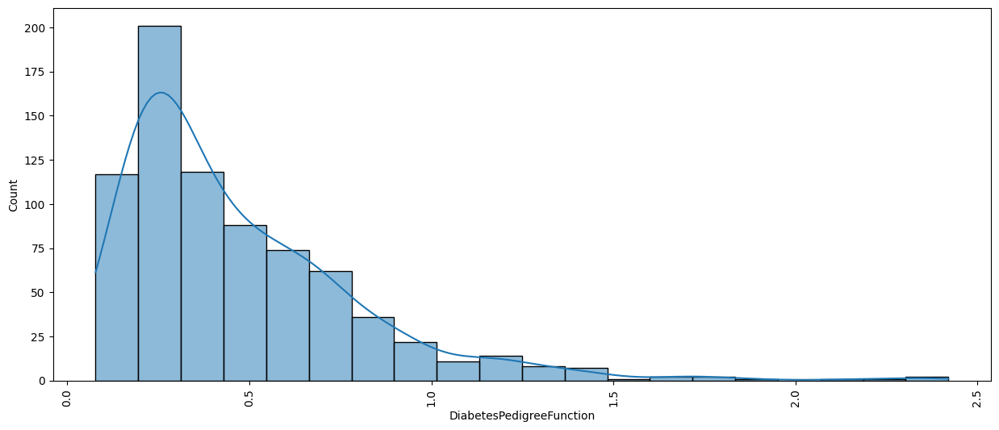

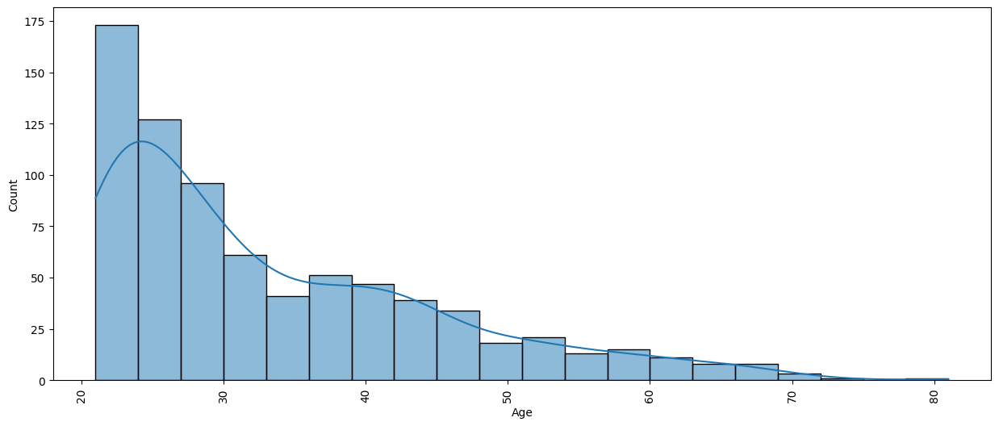

In [21]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.histplot(df[i], bins = 20, kde = True, palette='hls')
    plt.xticks(rotation = 90)
    plt.show()

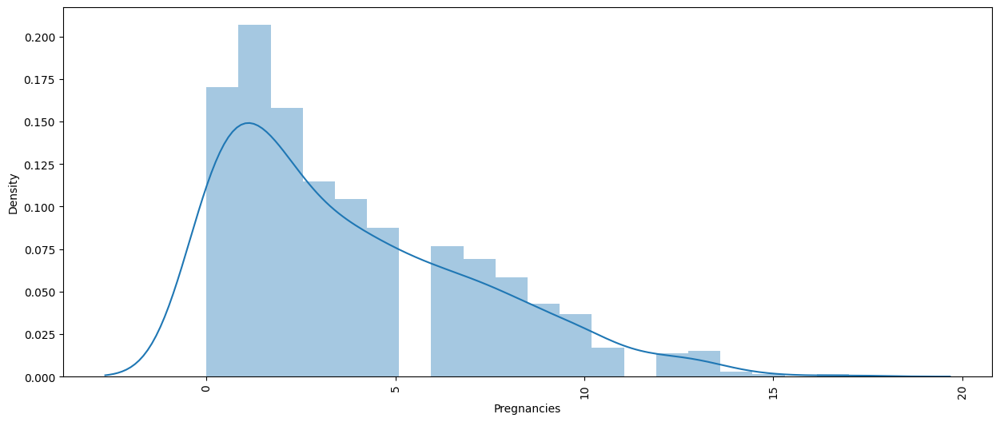

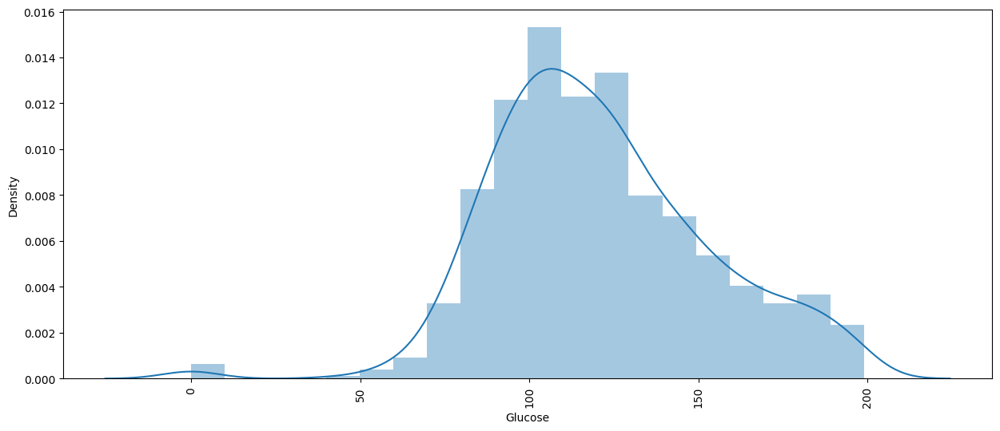

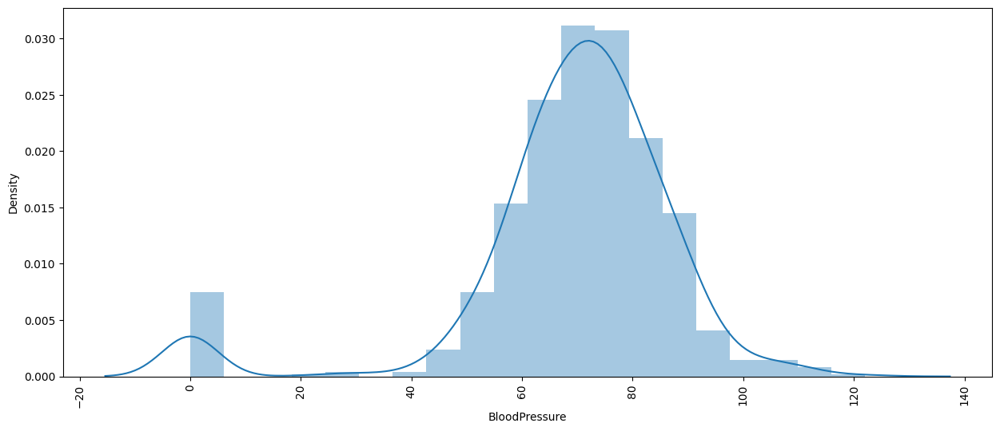

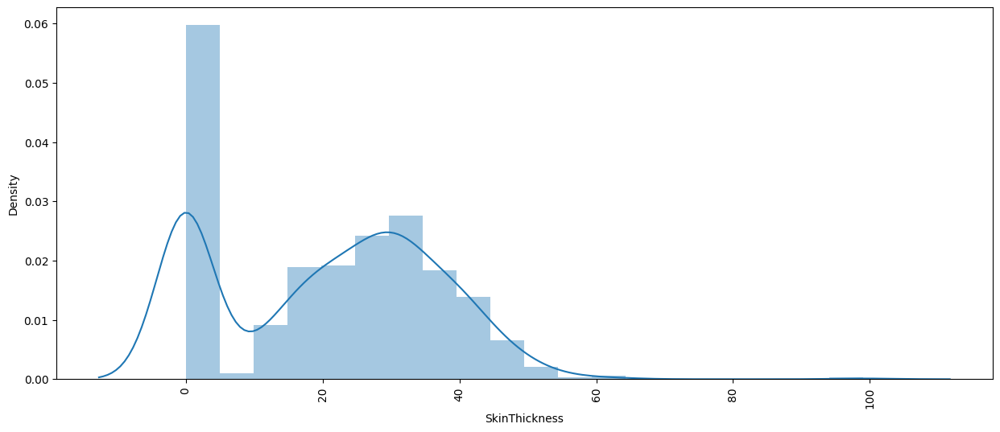

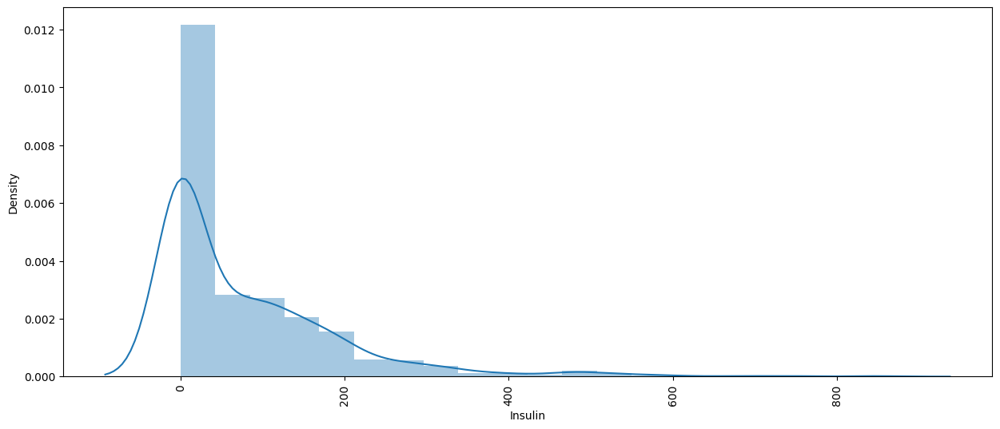

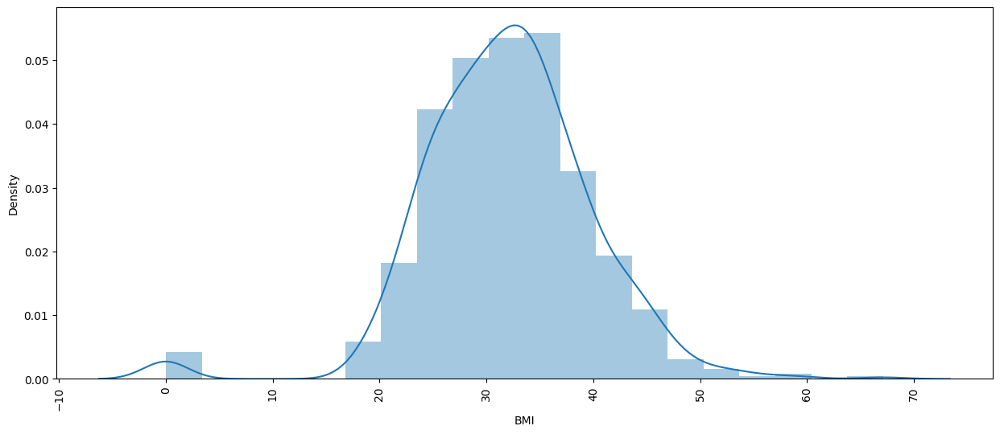

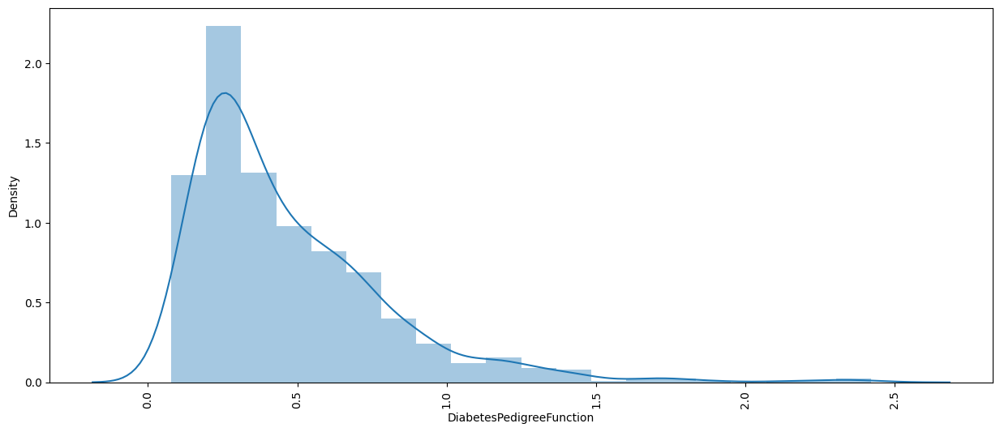

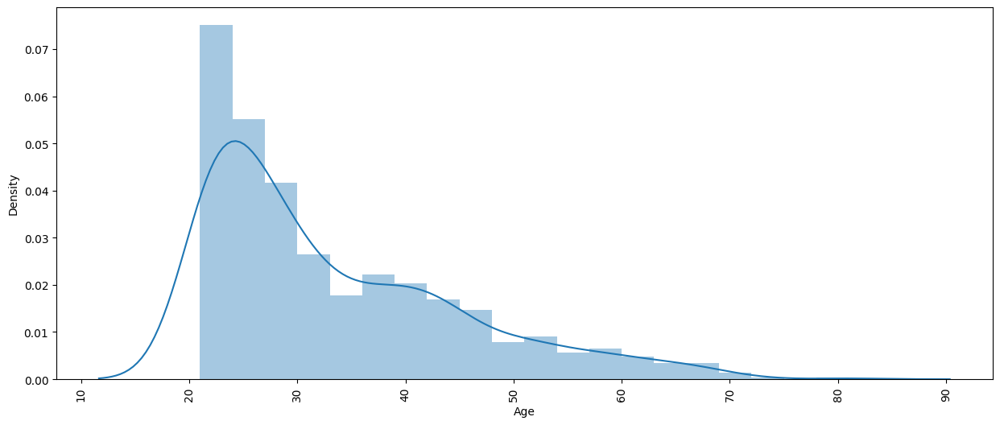

In [22]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.distplot(df[i], bins = 20, kde = True)
    plt.xticks(rotation = 90)
    plt.show()

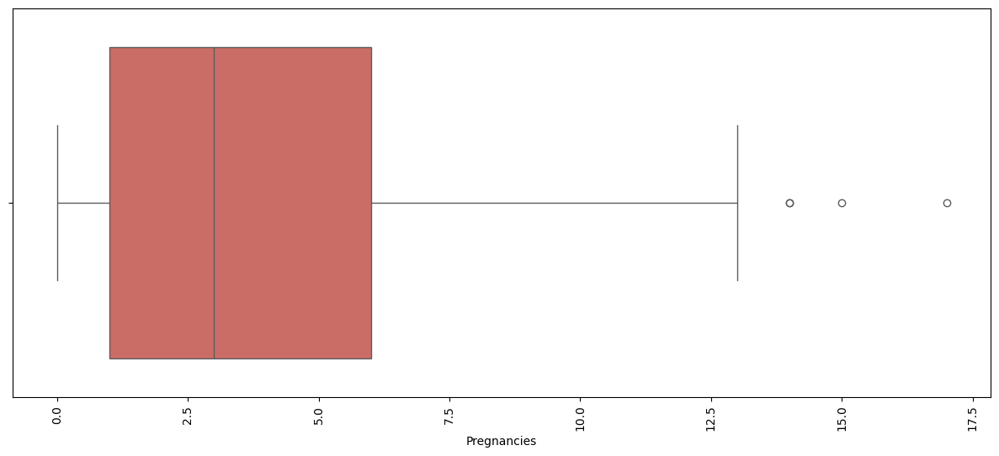

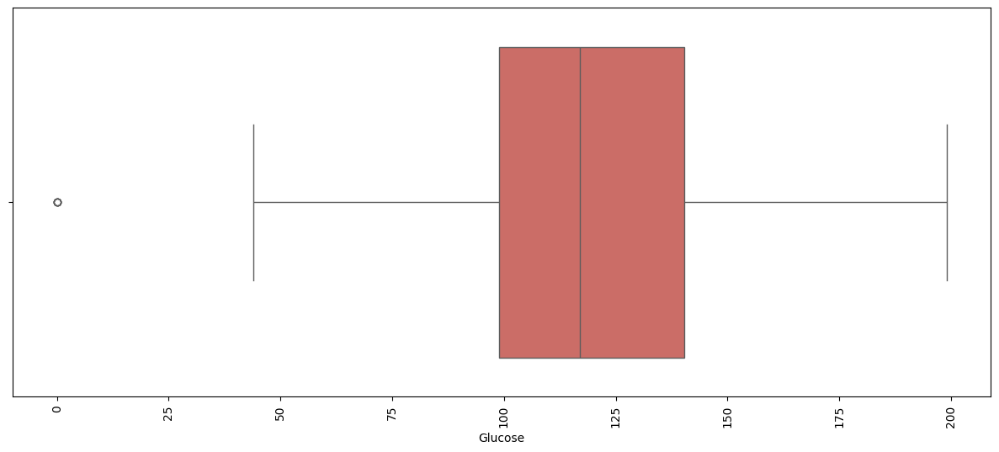

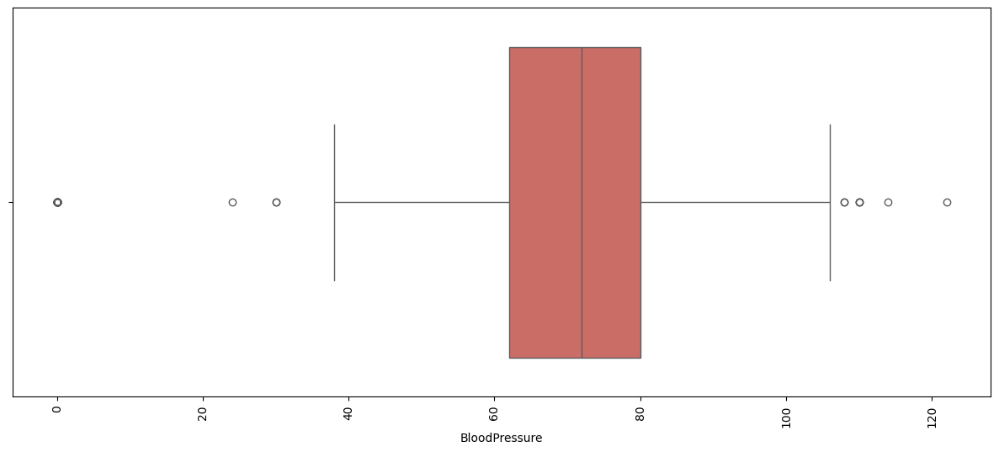

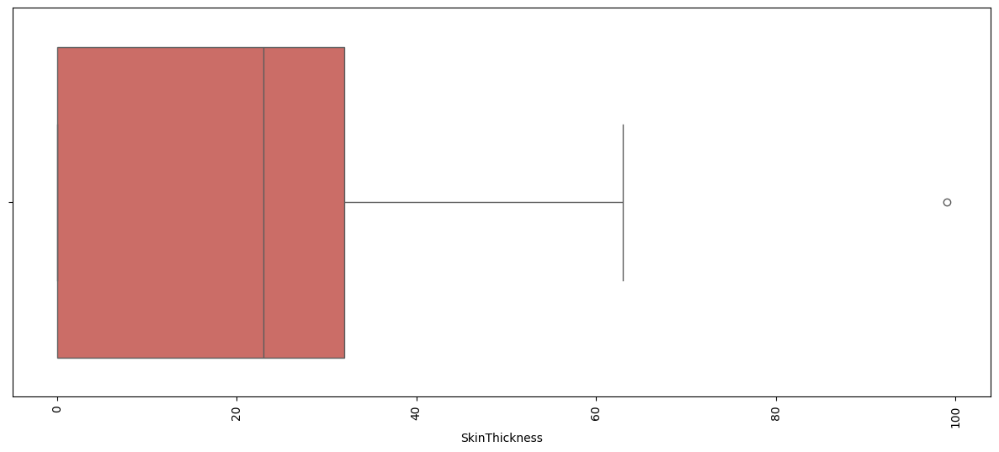

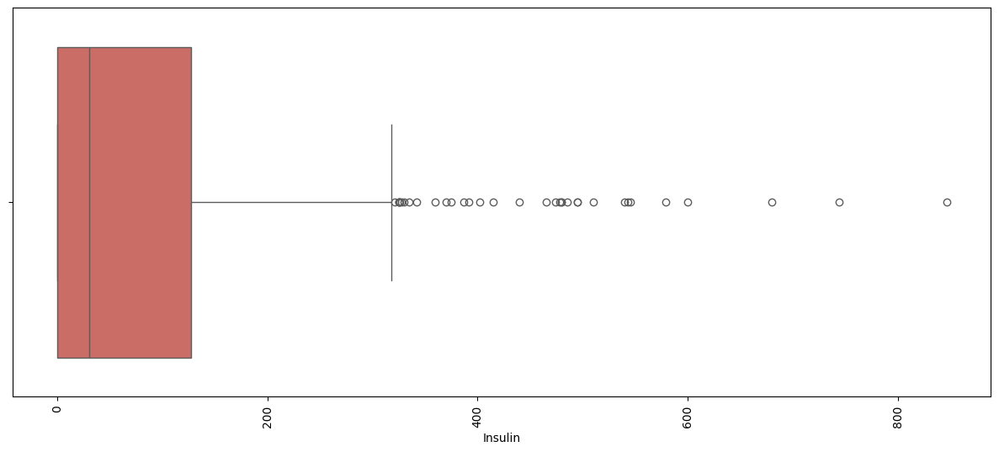

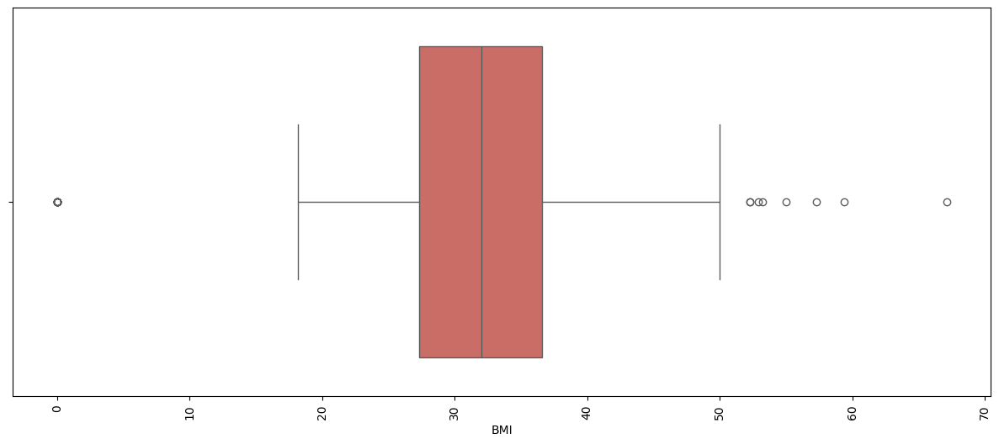

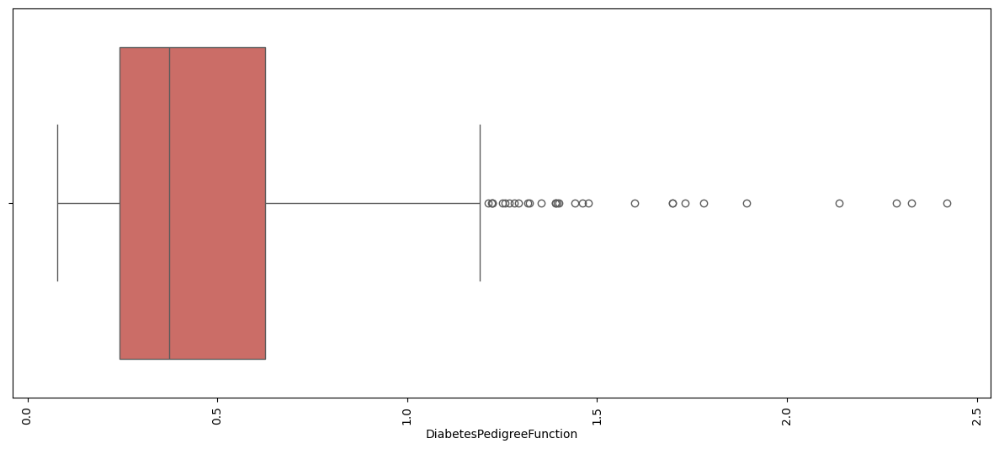

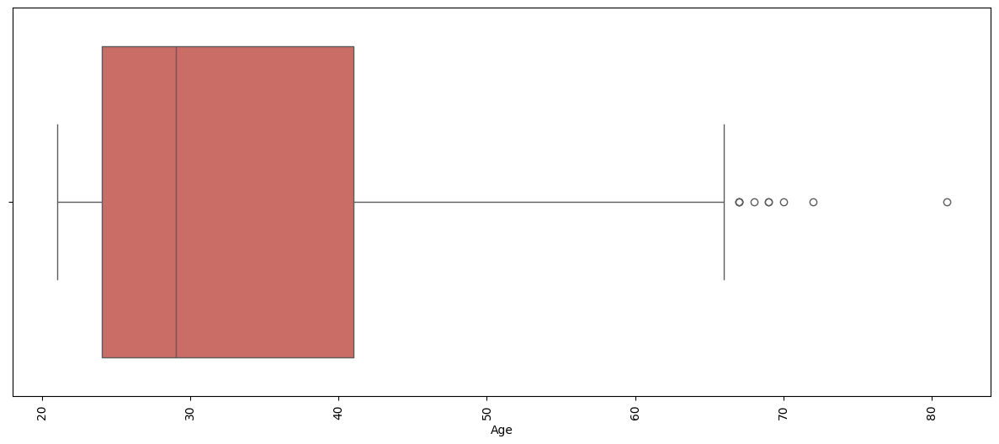

In [23]:
for i in continuous:
    plt.figure(figsize=(15, 6))
    sns.boxplot(x=i, data=df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

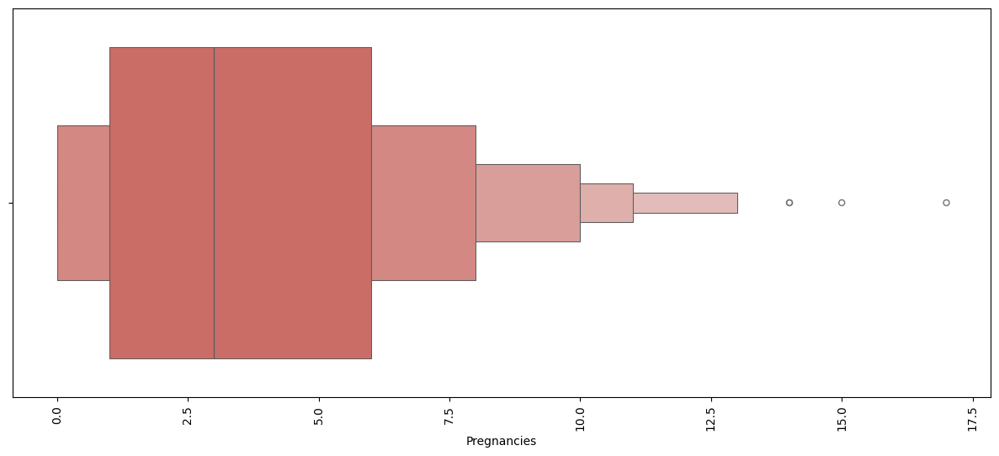

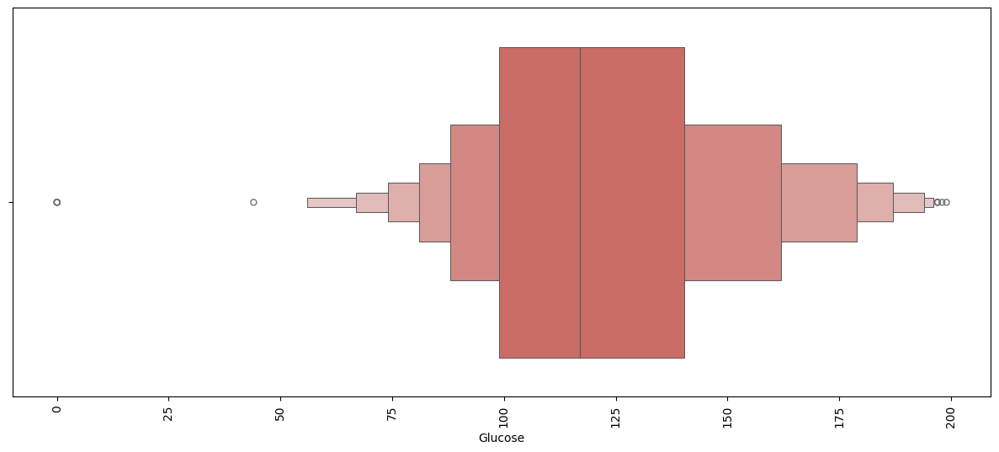

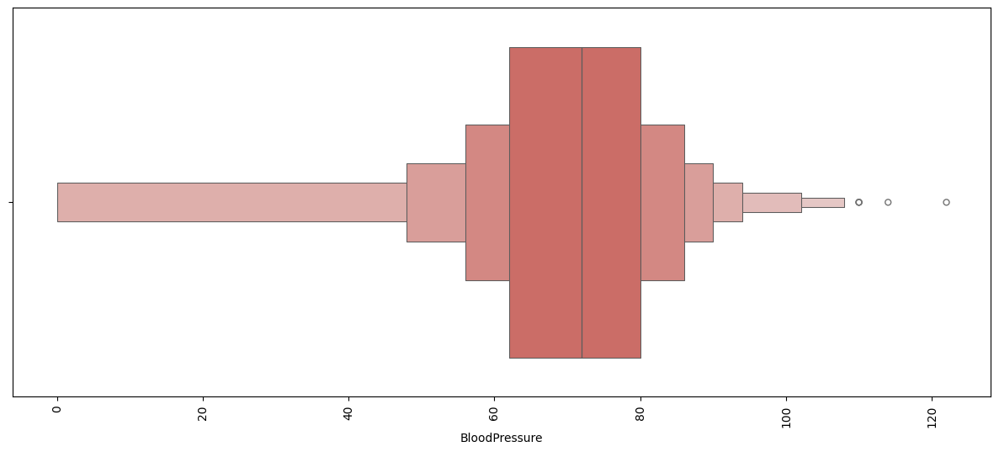

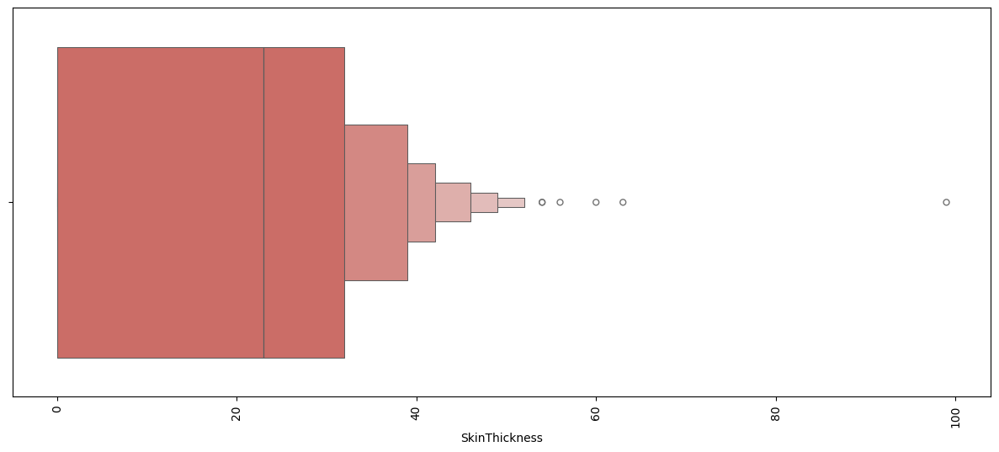

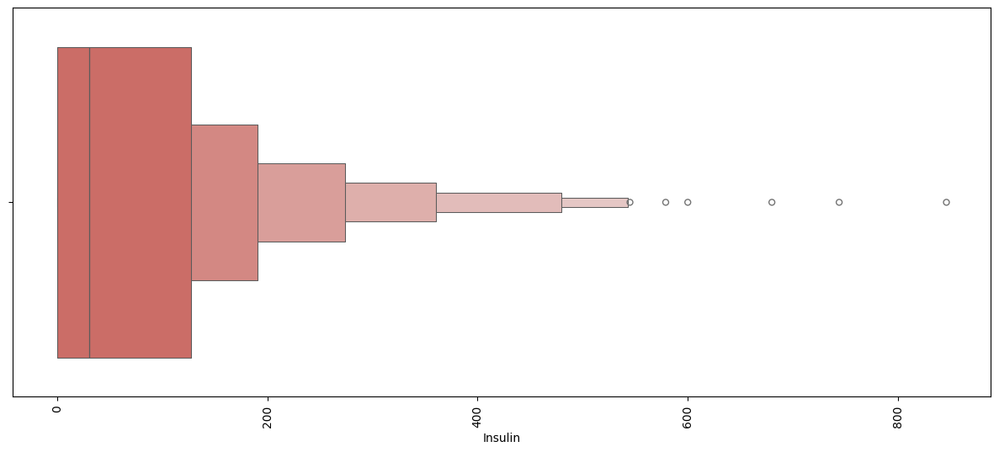

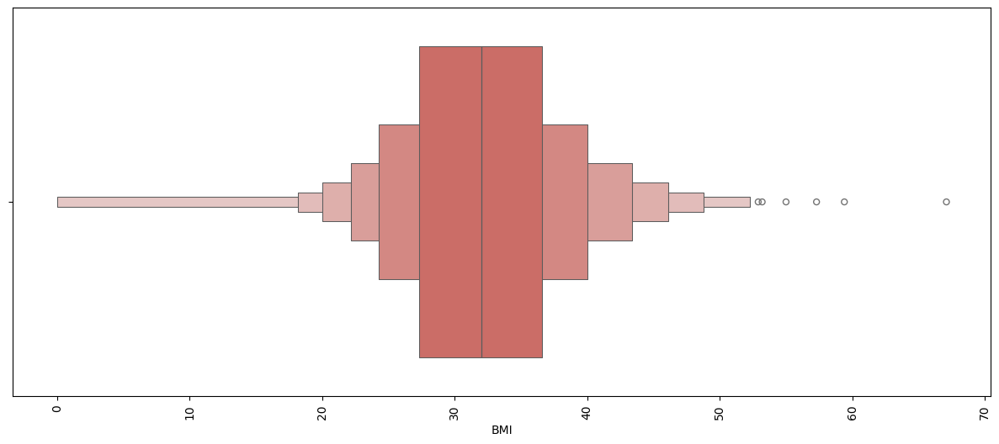

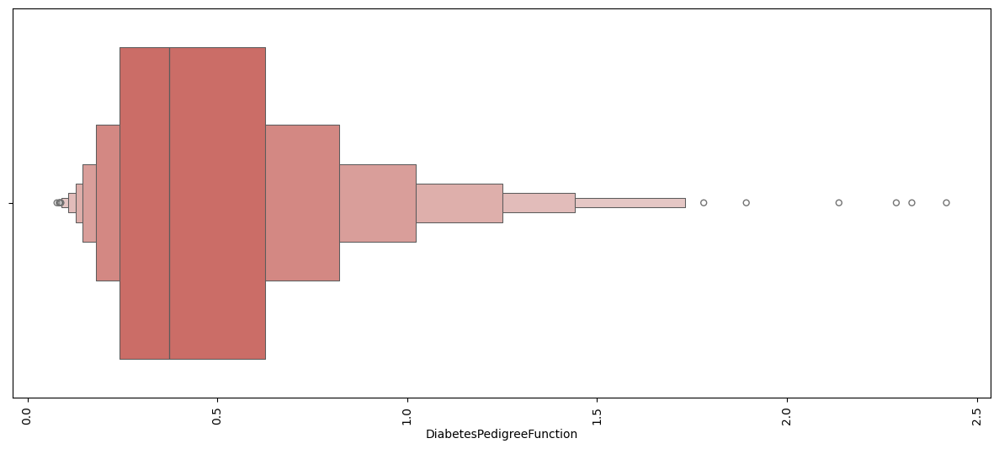

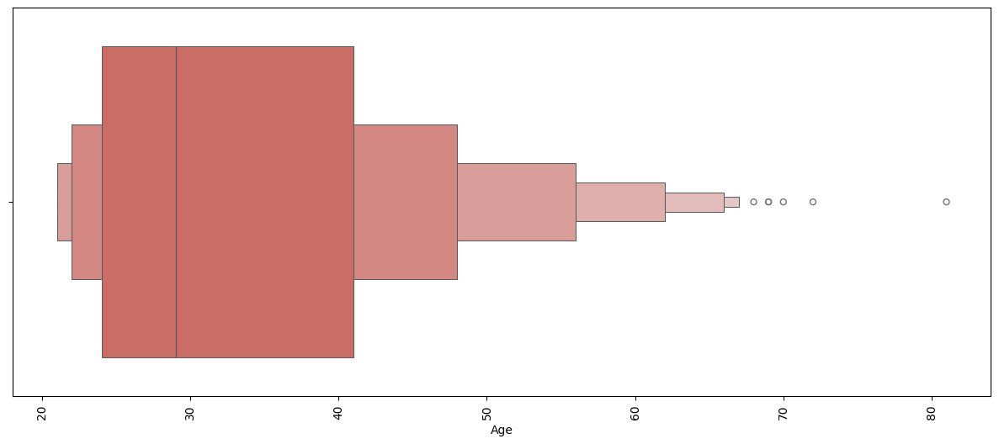

In [24]:
for i in continuous:
    plt.figure(figsize=(15, 6))
    sns.boxenplot(x=i, data=df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

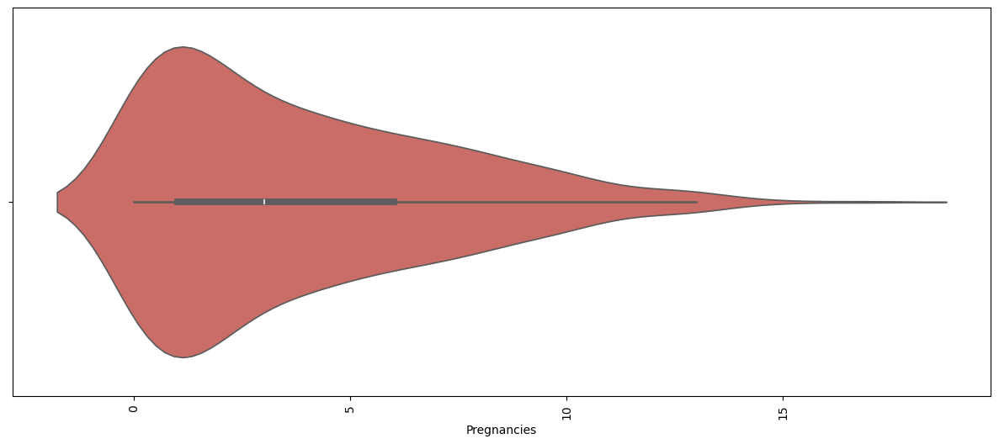

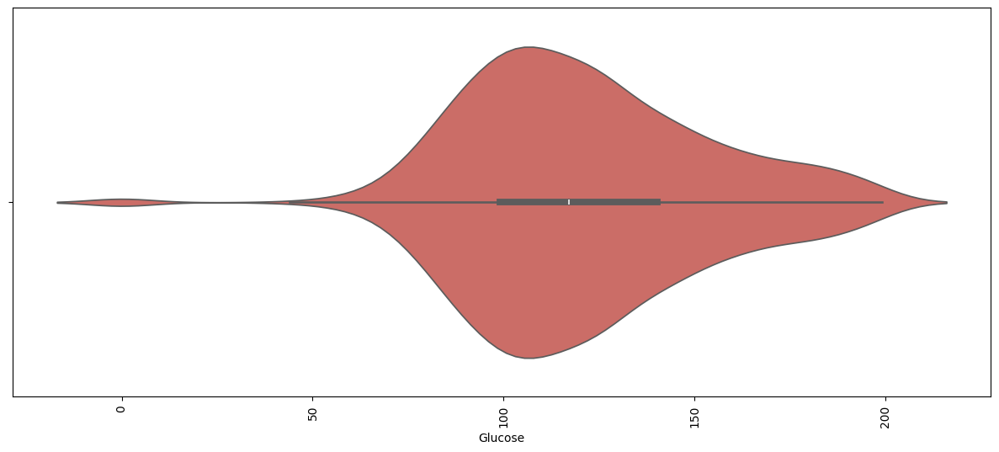

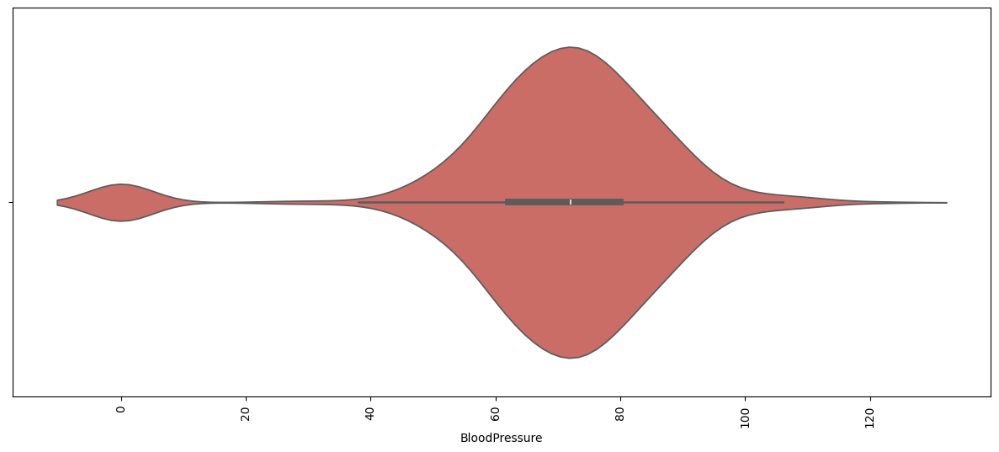

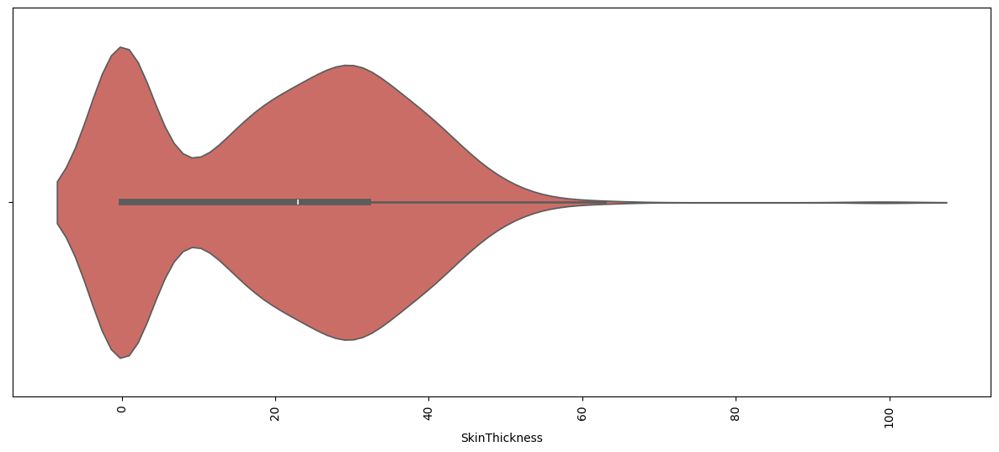

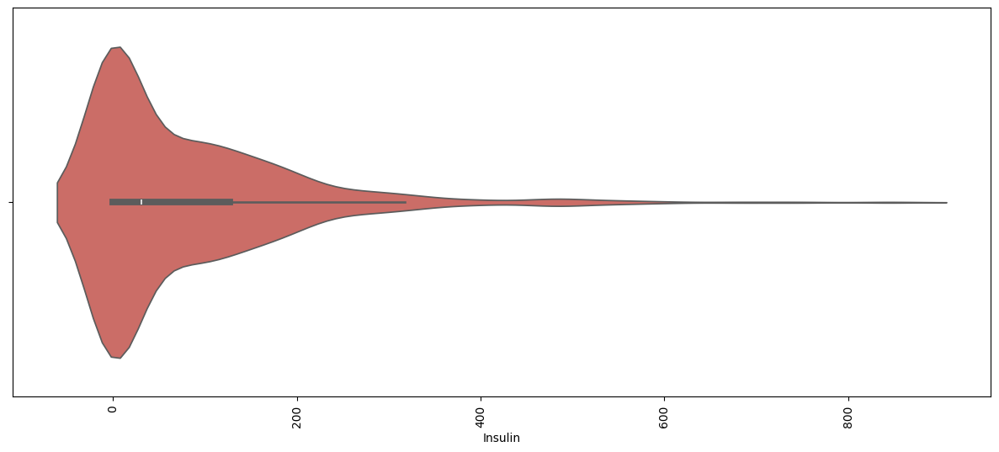

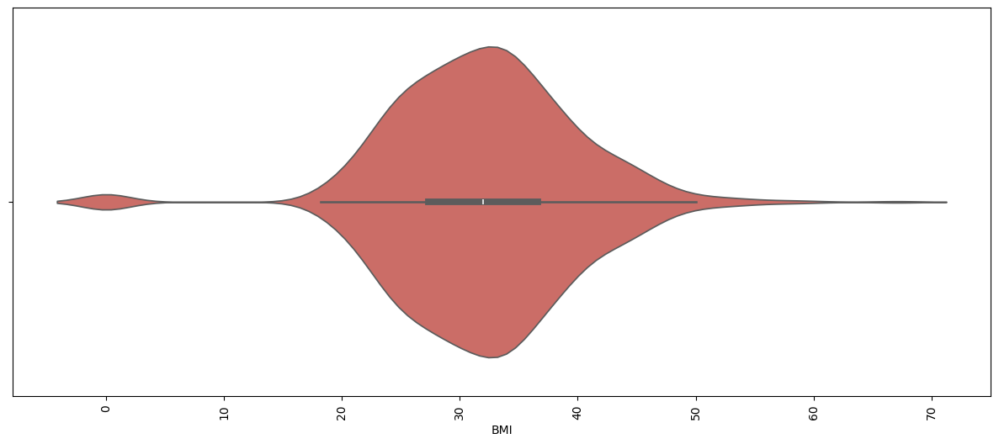

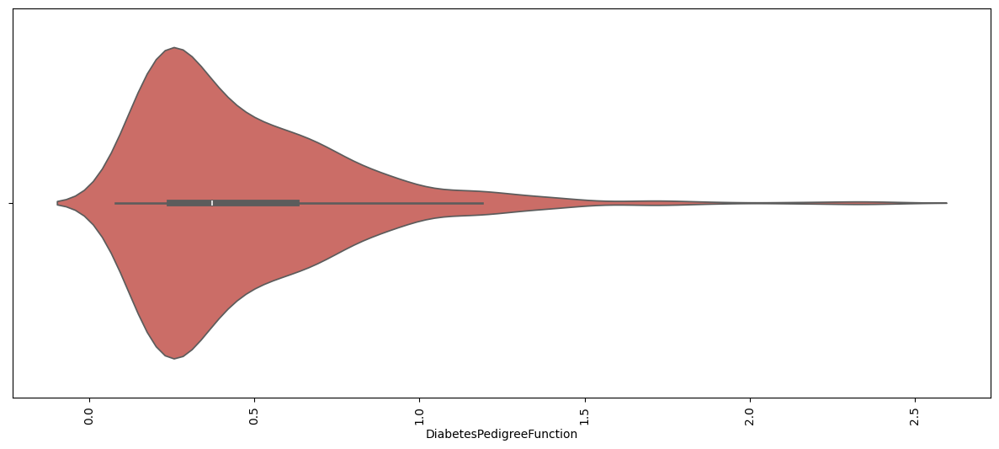

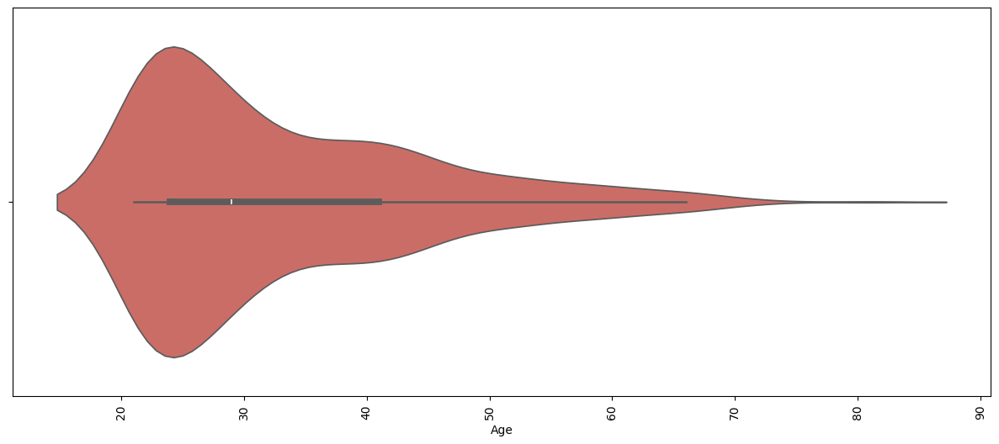

In [25]:
for i in continuous:
    plt.figure(figsize=(15, 6))
    sns.violinplot(x=i, data=df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

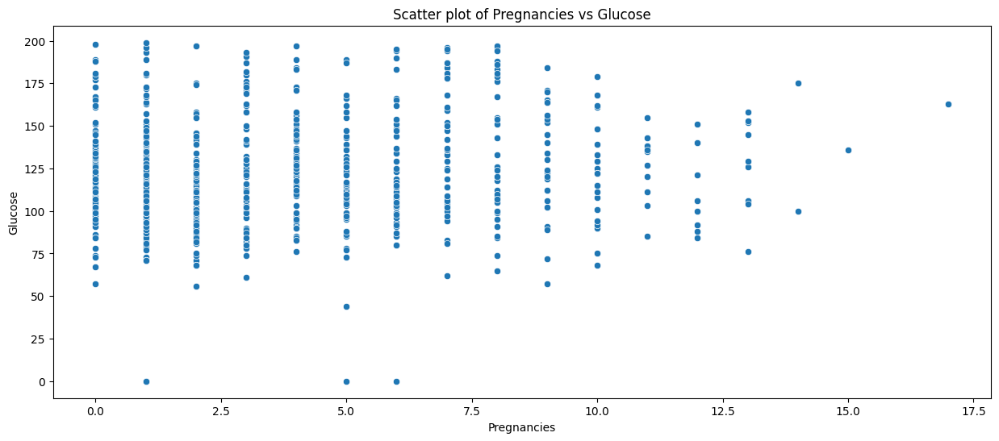

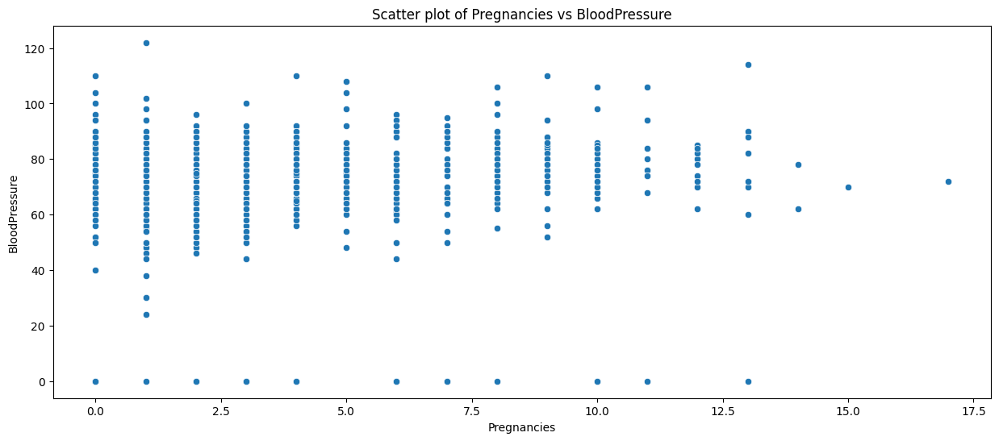

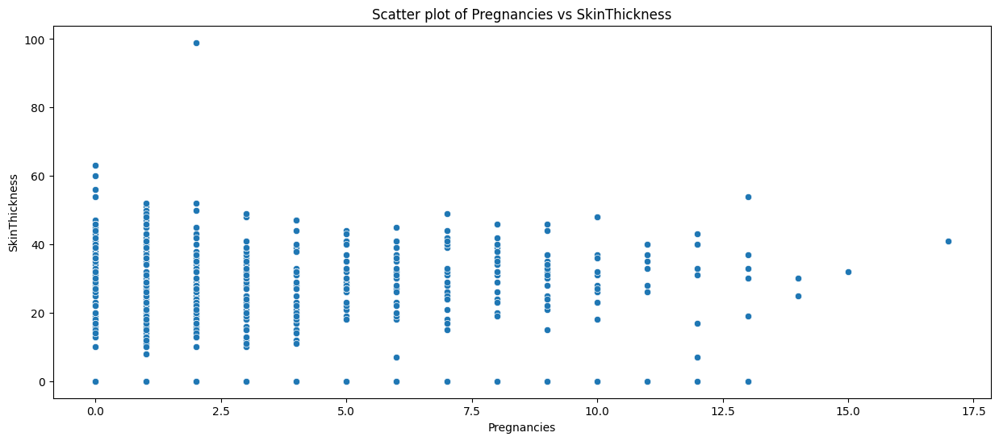

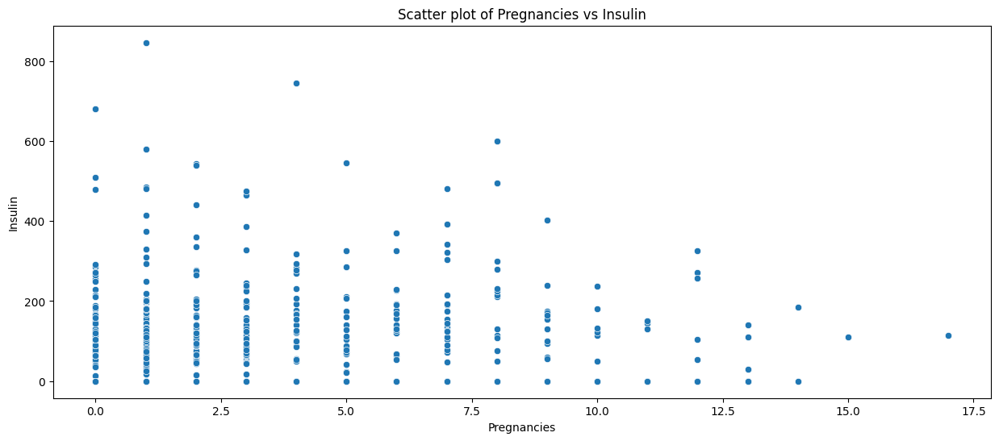

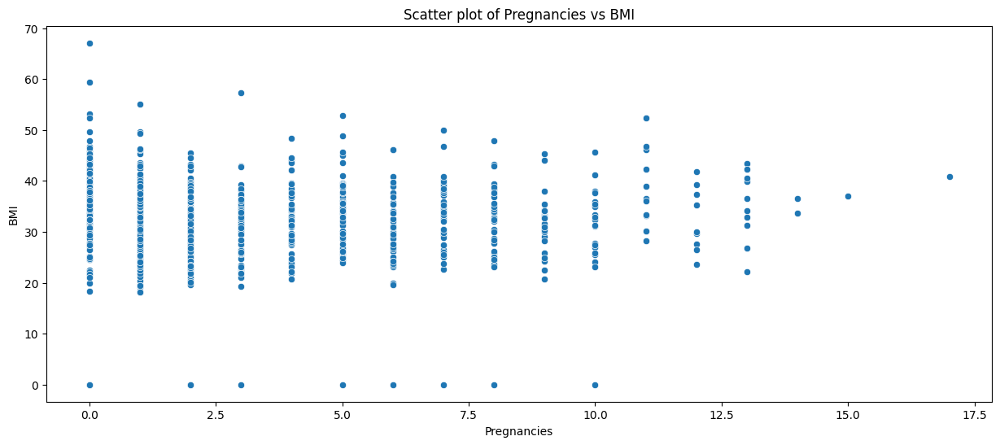

...

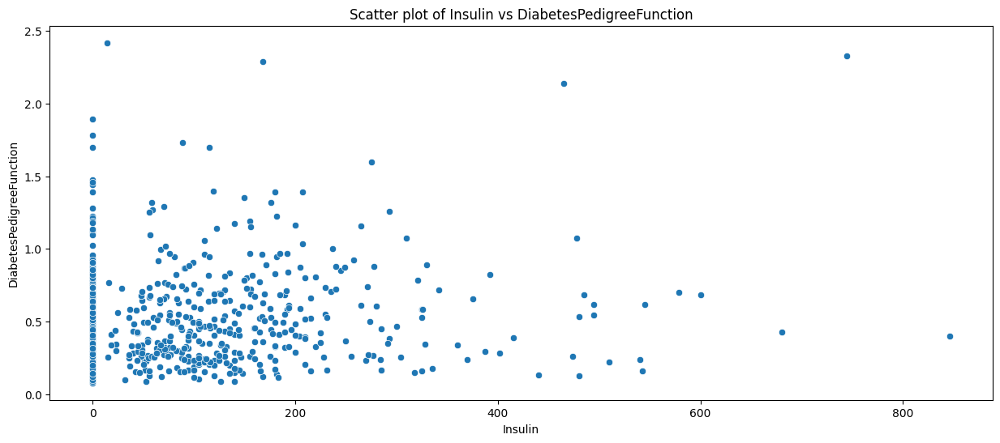

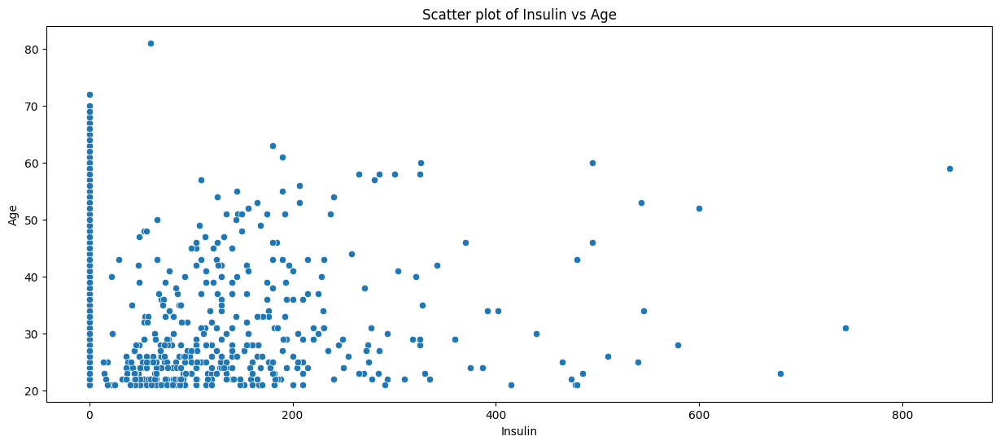

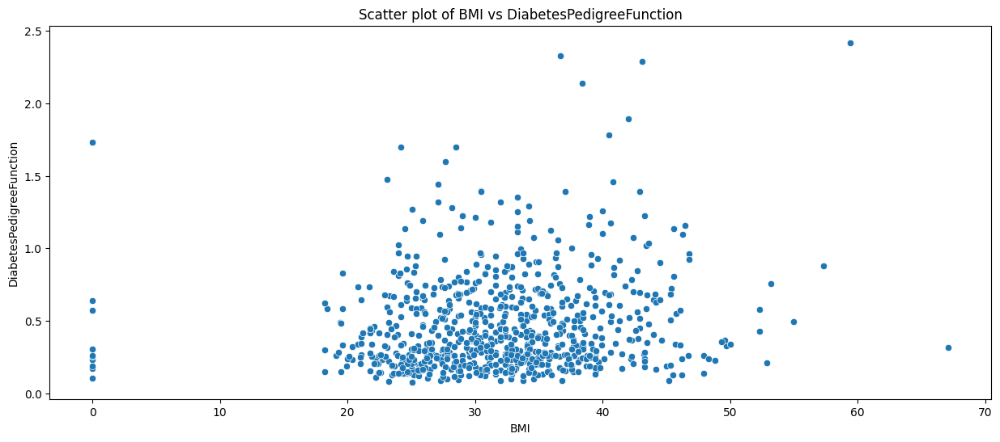

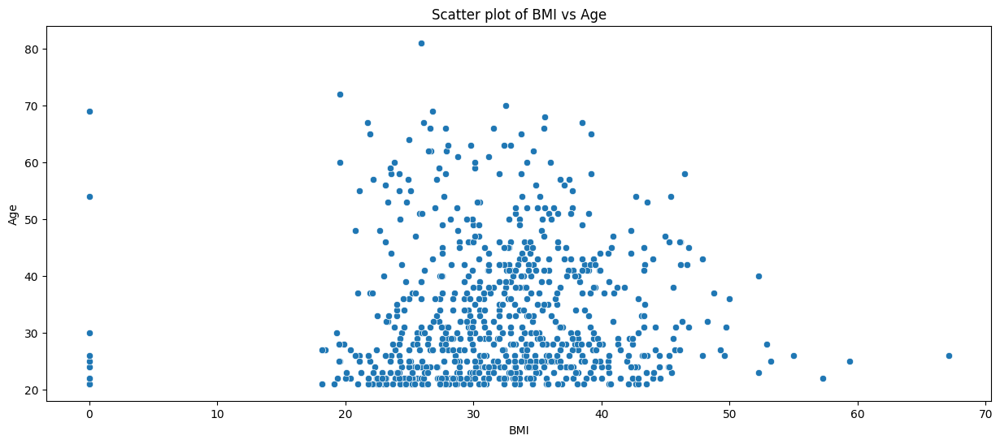

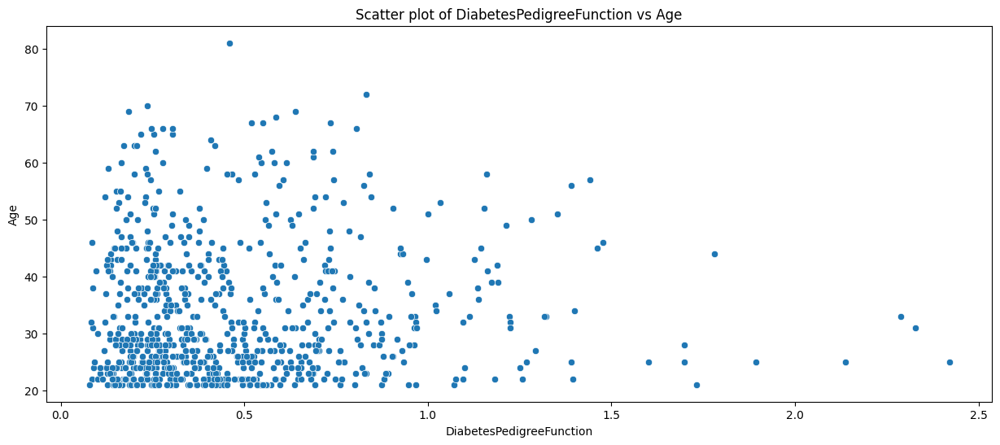

In [26]:
for i in range(len(continuous)):
    for j in range(i + 1, len(continuous)):
        plt.figure(figsize=(15, 6))
        sns.scatterplot(x=continuous[i], y=continuous[j], data=df, palette='hls')
        plt.title(f'Scatter plot of {continuous[i]} vs {continuous[j]}')
        plt.show()

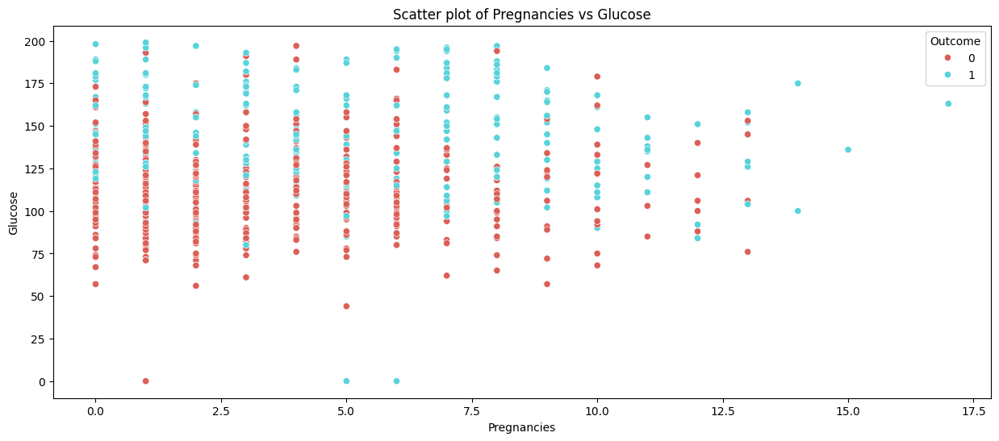

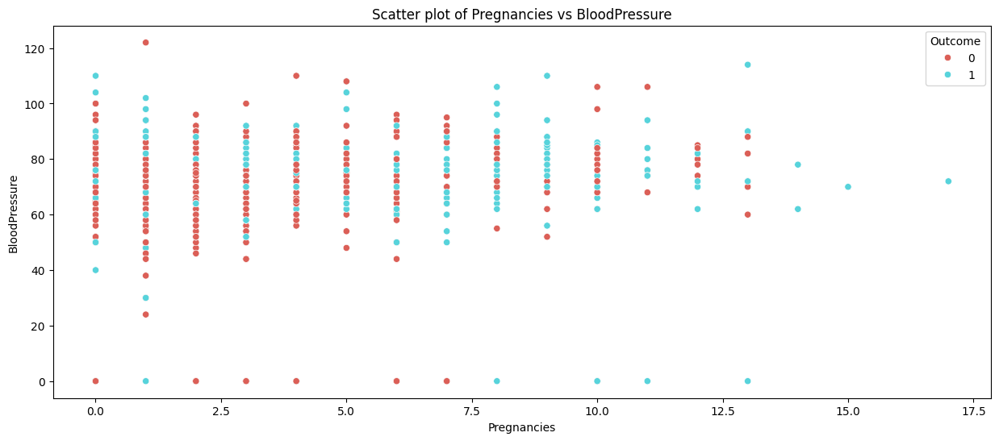

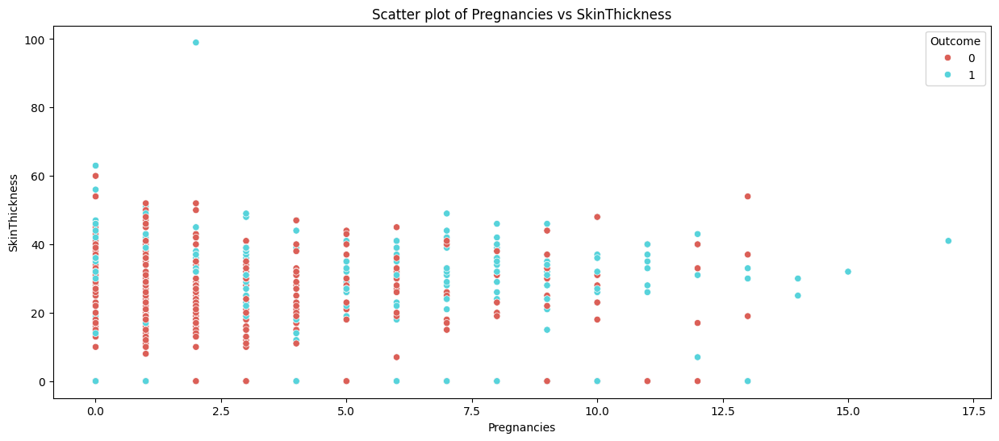

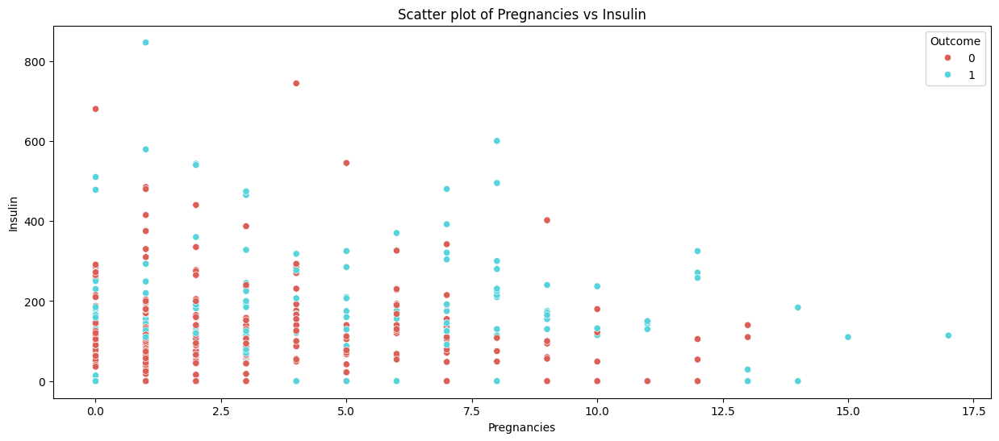

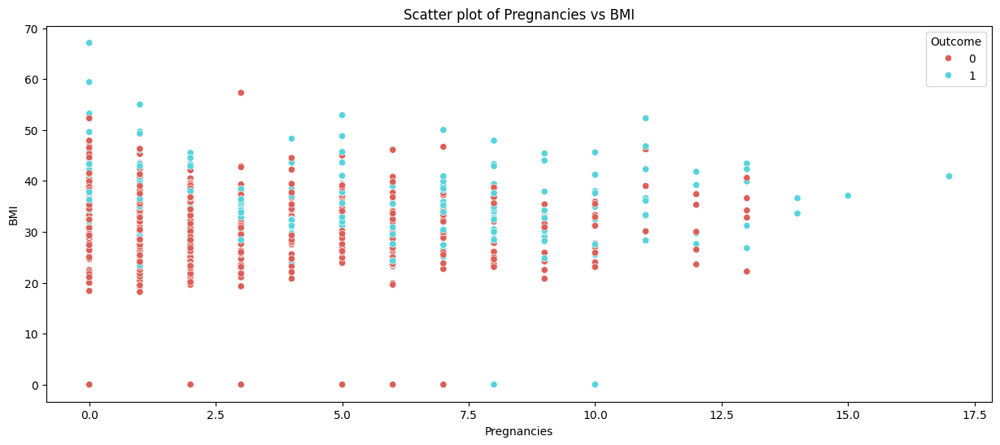

...

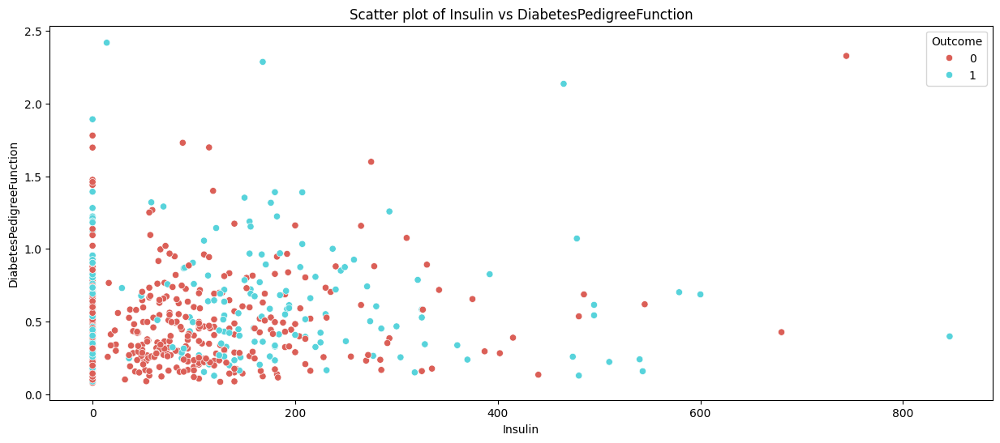

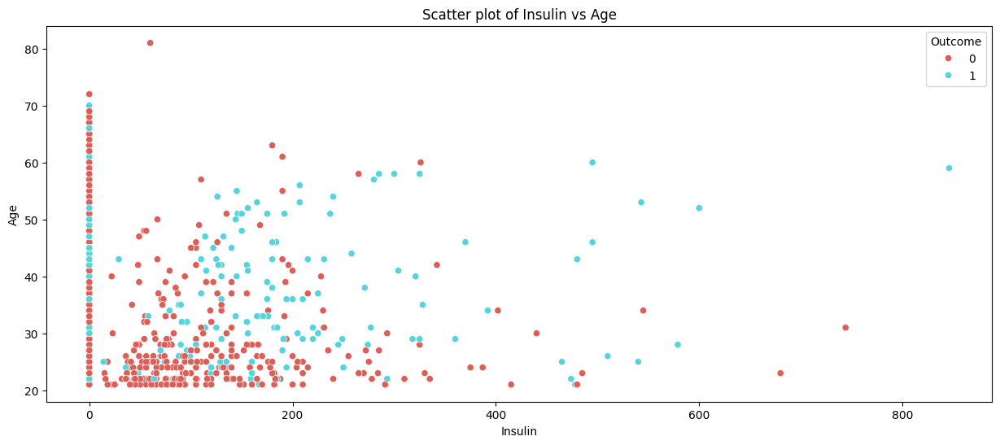

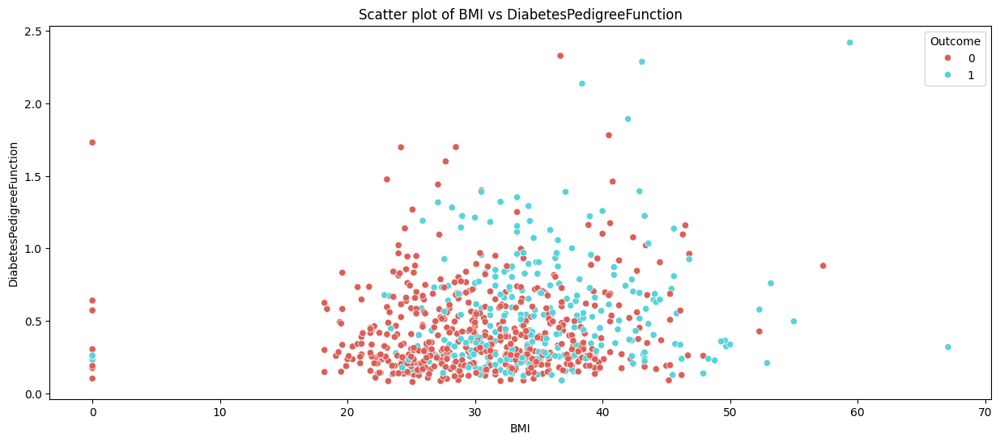

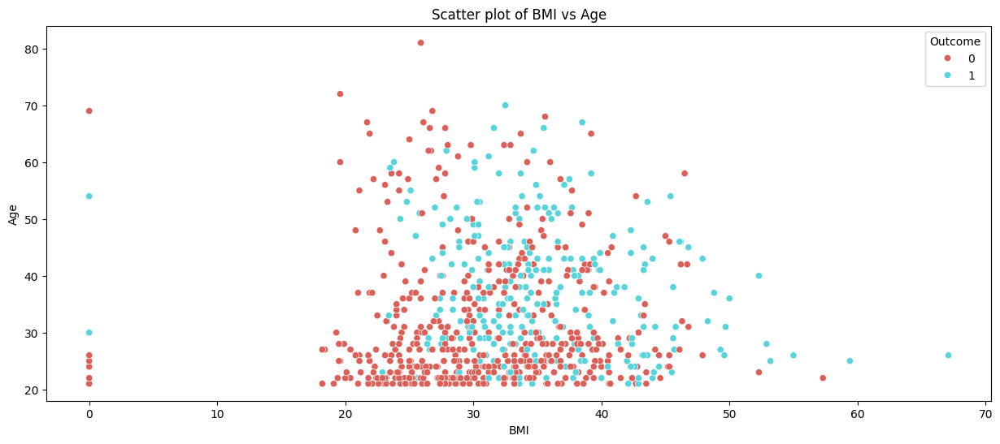

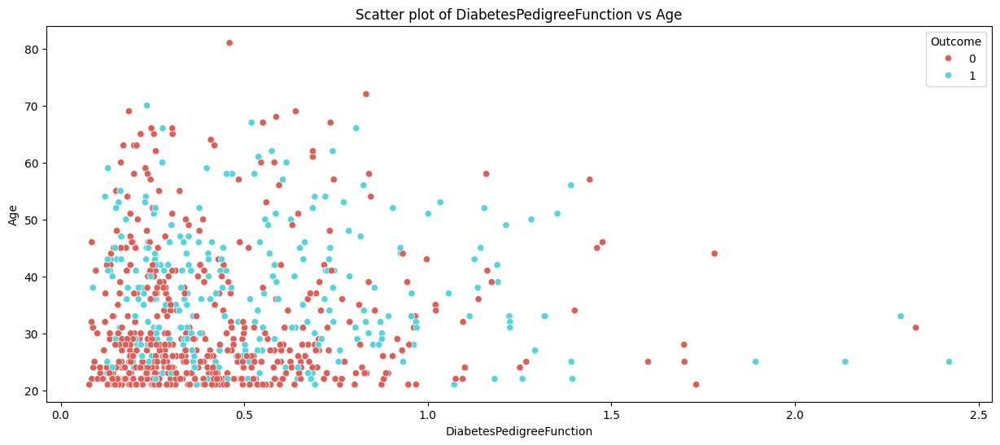

In [27]:
for i in range(len(continuous)):
    for j in range(i + 1, len(continuous)):
        plt.figure(figsize=(15, 6))
        sns.scatterplot(x=continuous[i], y=continuous[j], data=df, hue = 'Outcome', palette='hls')
        plt.title(f'Scatter plot of {continuous[i]} vs {continuous[j]}')
        plt.show()

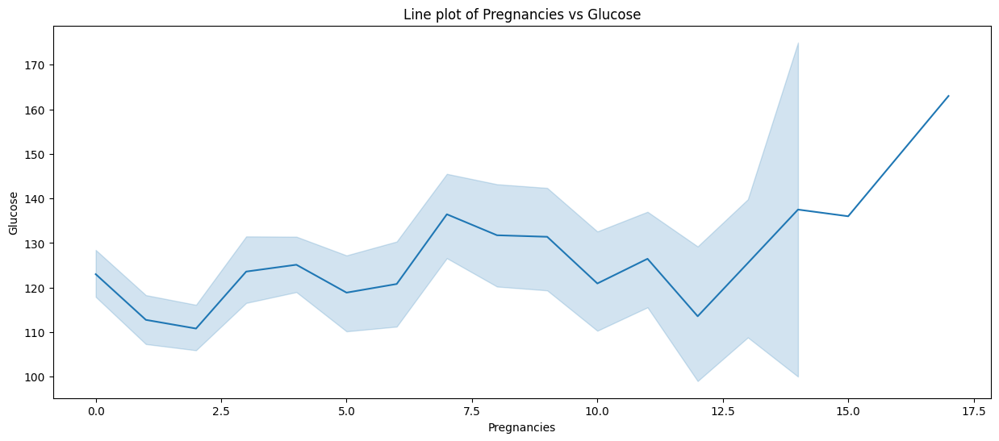

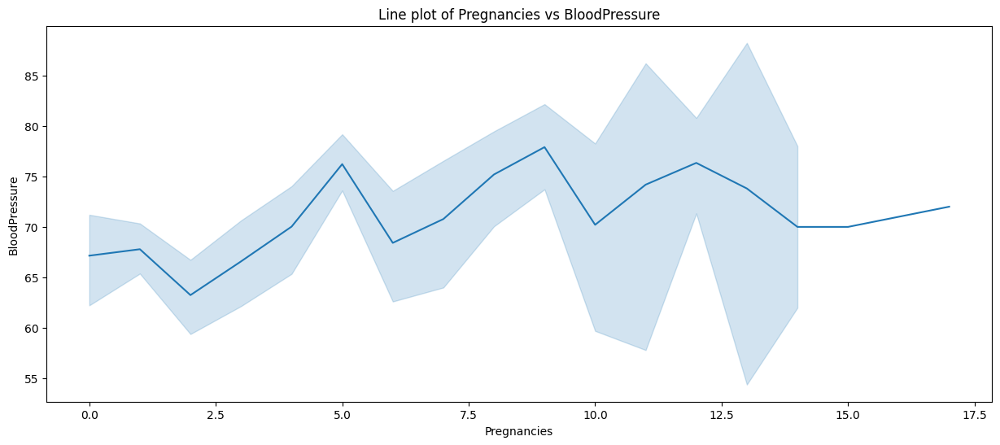

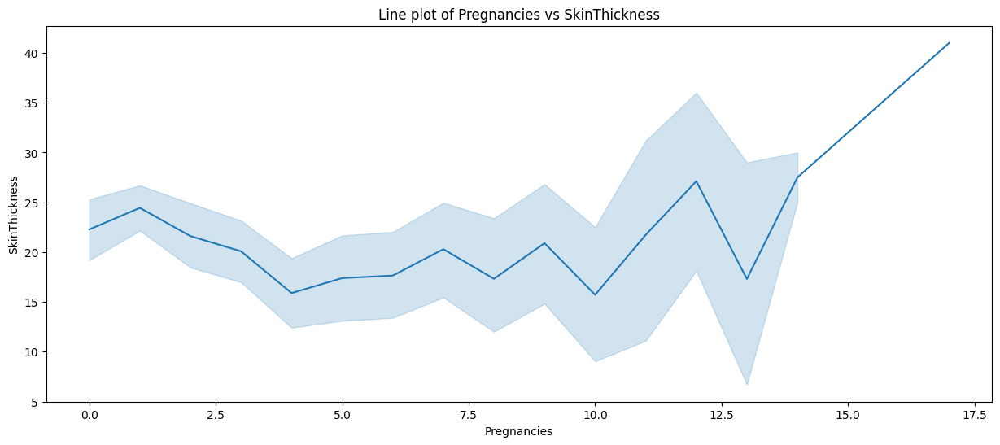

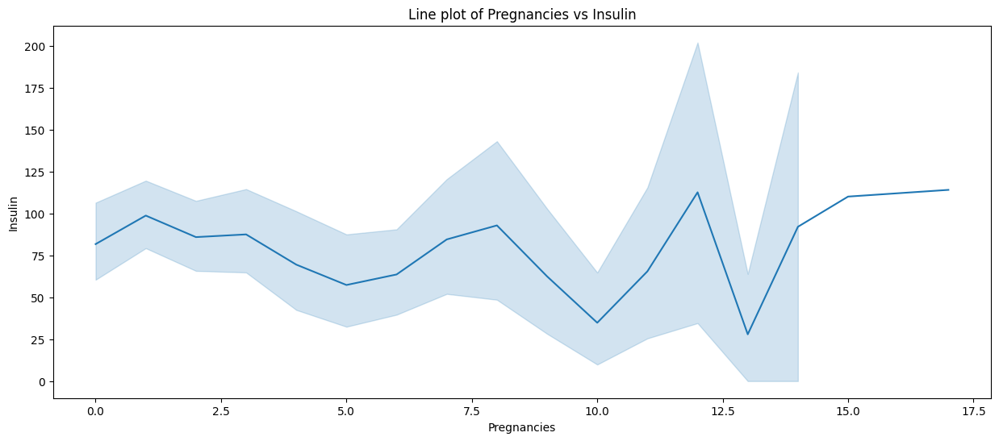

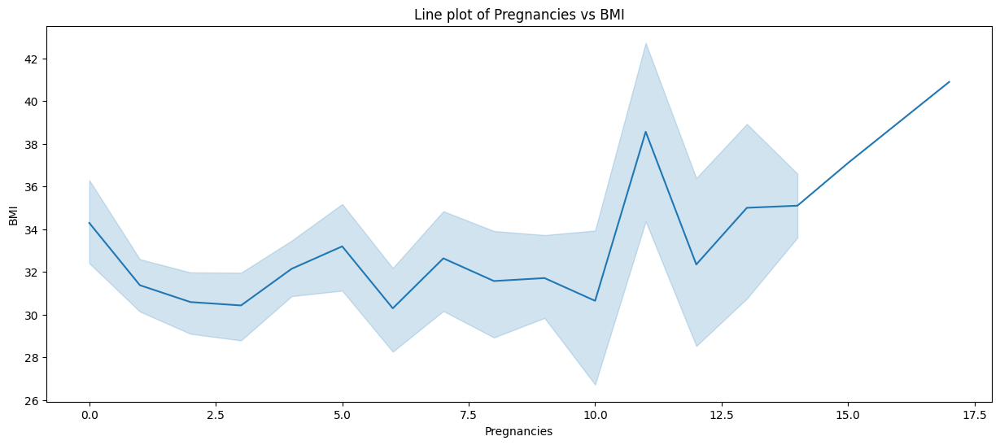

...

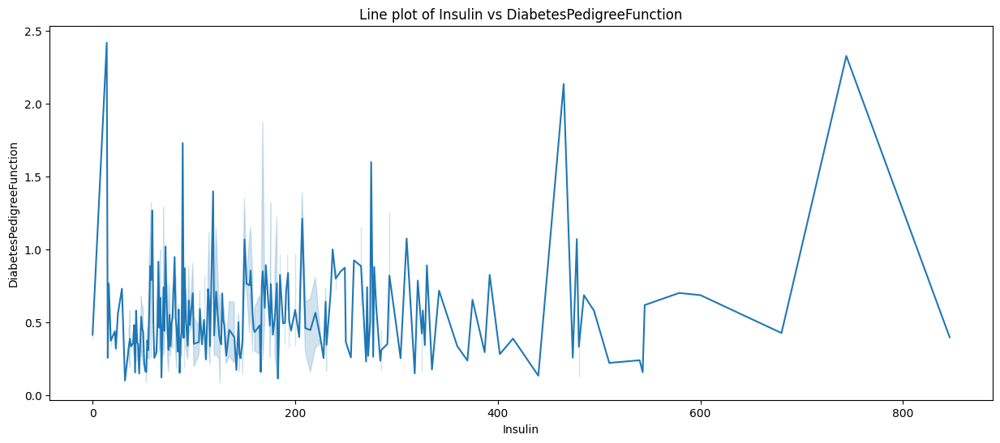

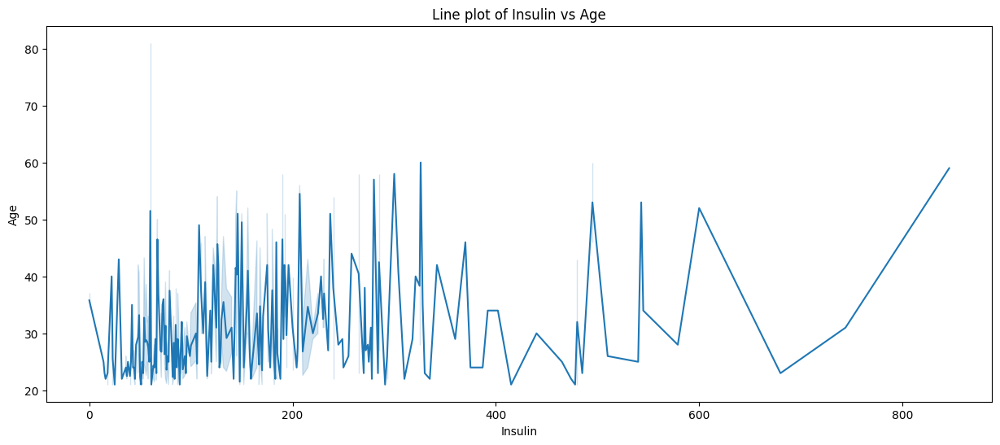

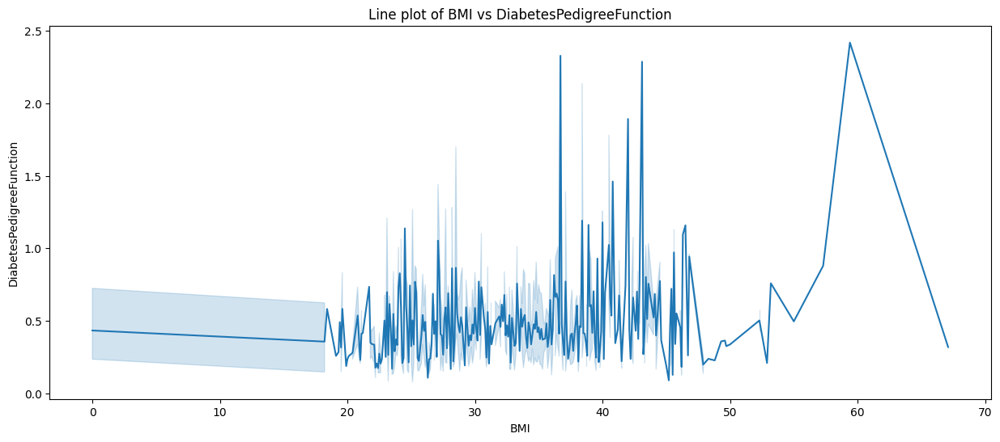

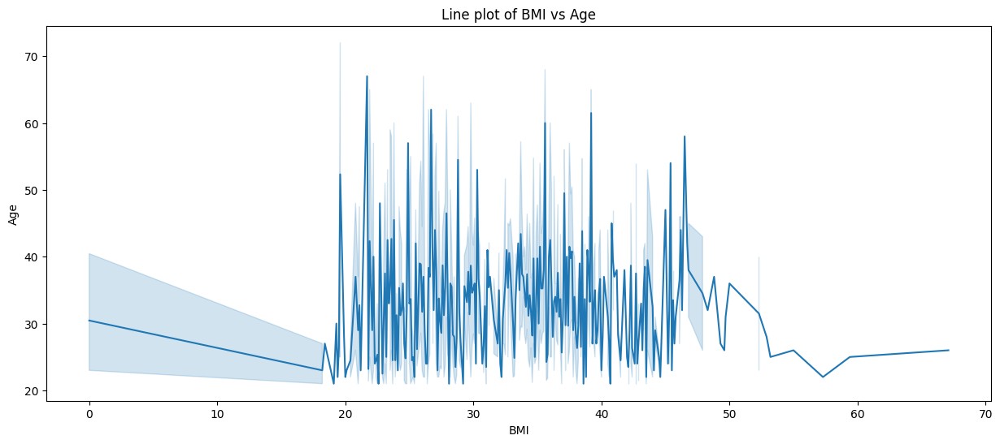

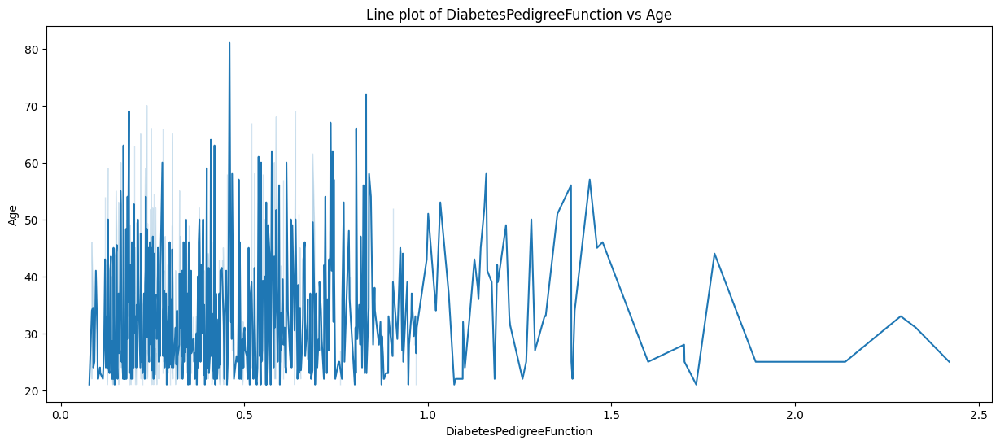

In [28]:
for i in range(len(continuous)):
    for j in range(i + 1, len(continuous)):
        plt.figure(figsize=(15, 6))
        sns.lineplot(x=continuous[i], y=continuous[j], data=df, palette='hls')
        plt.title(f'Line plot of {continuous[i]} vs {continuous[j]}')
        plt.show()

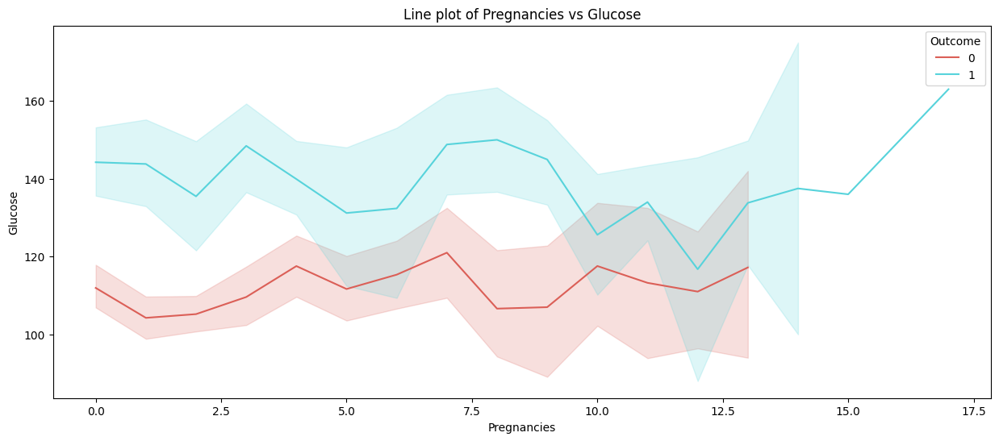

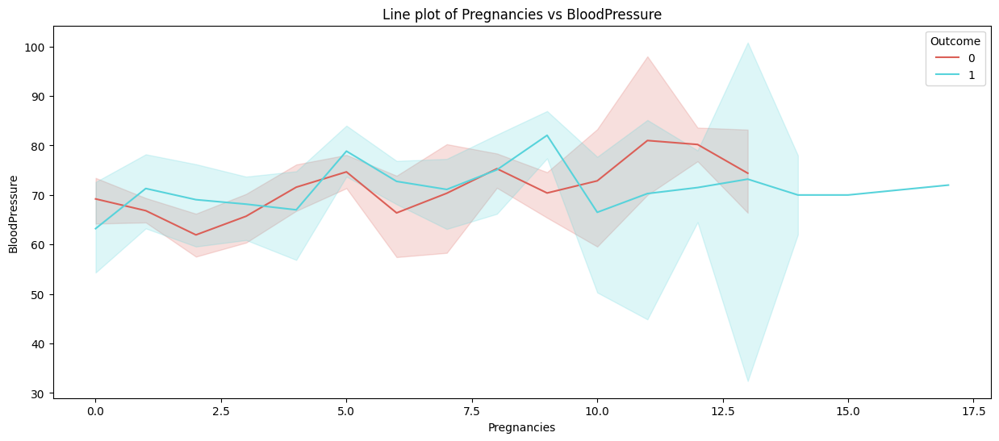

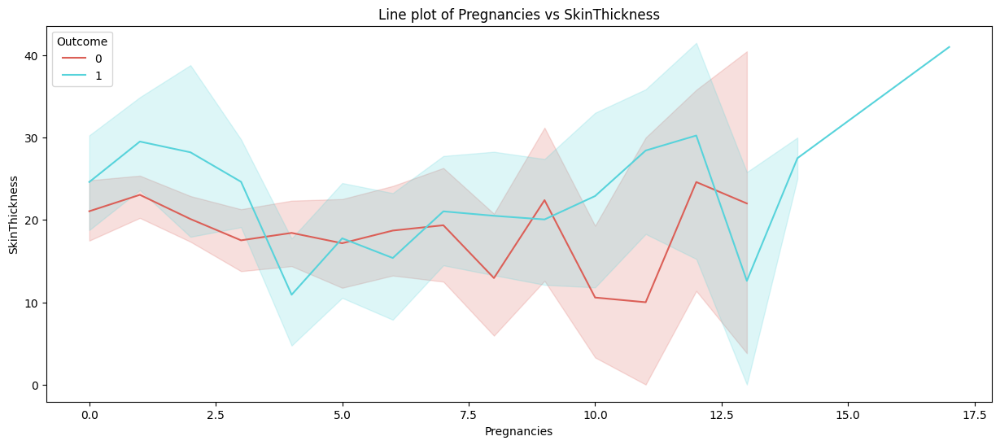

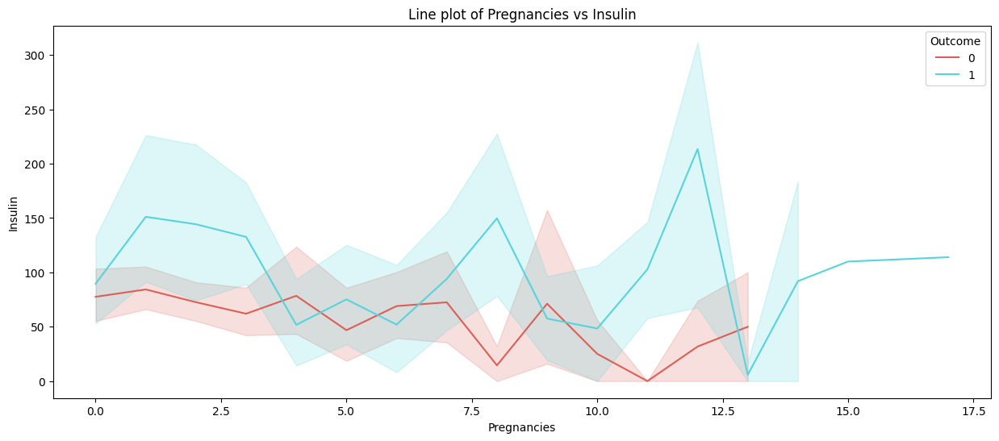

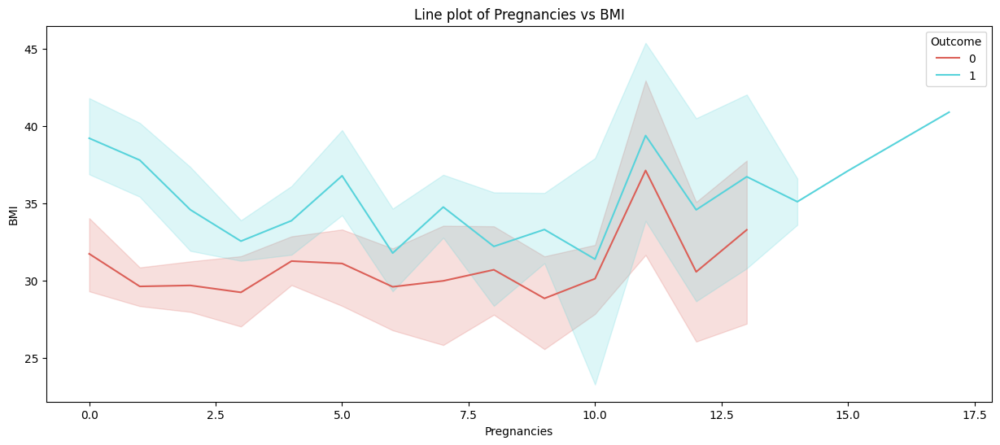

...

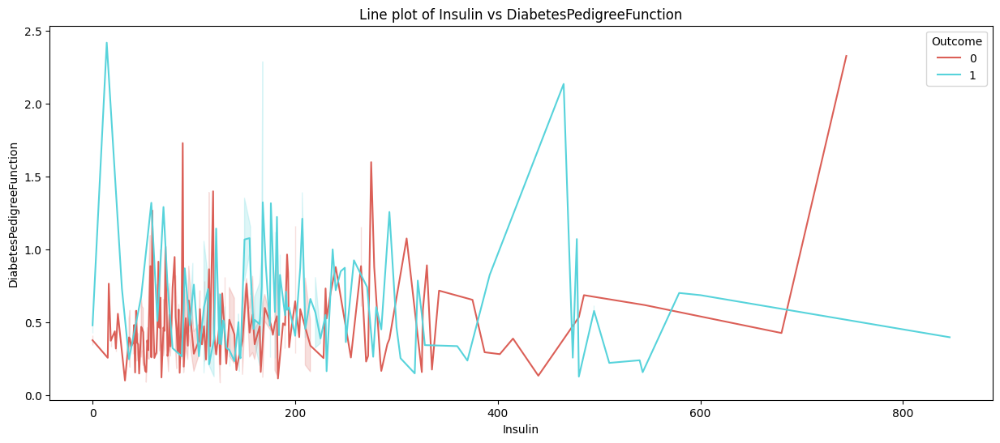

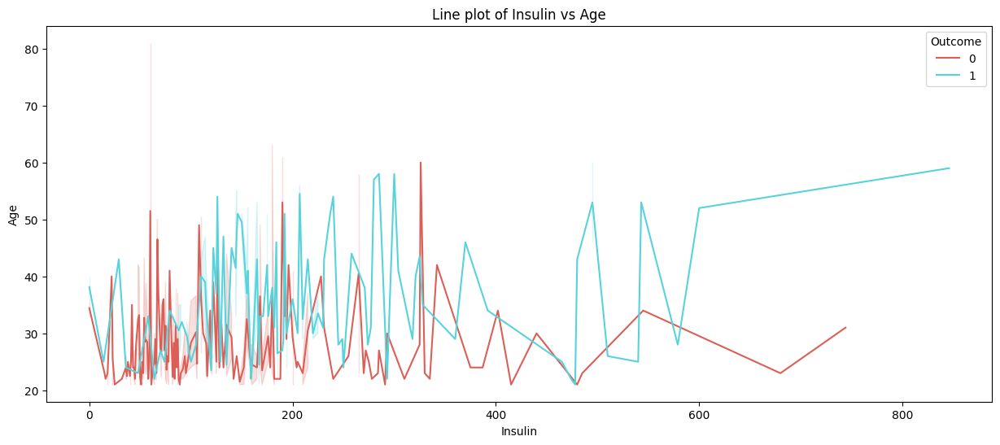

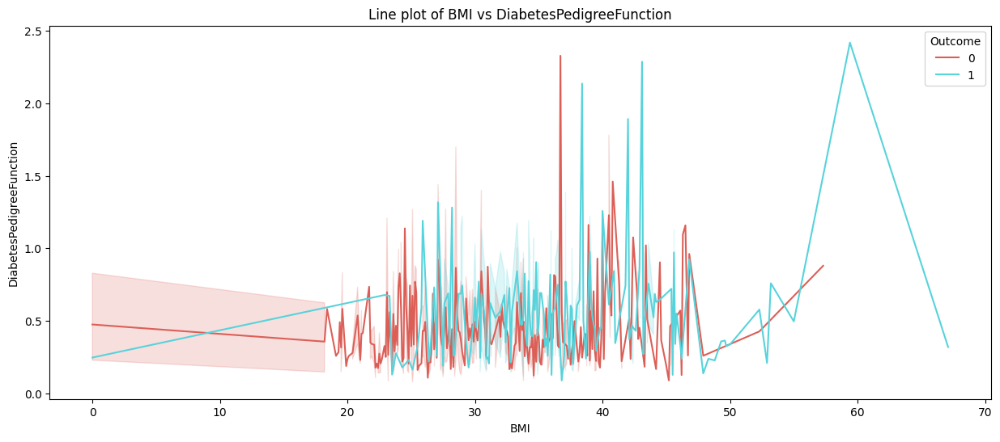

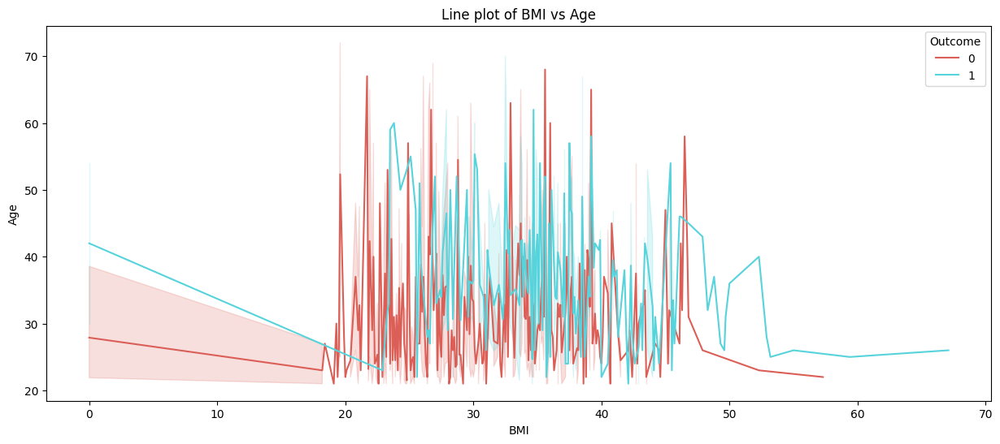

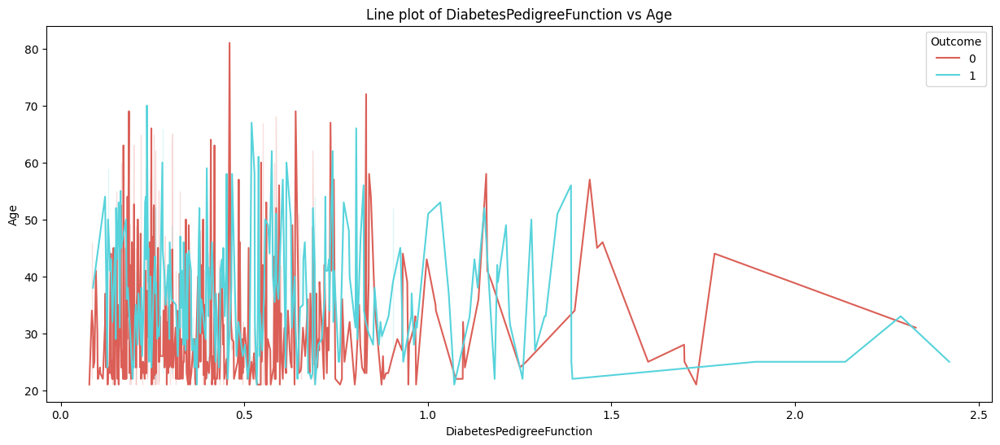

In [29]:
for i in range(len(continuous)):
    for j in range(i + 1, len(continuous)):
        plt.figure(figsize=(15, 6))
        sns.lineplot(x=continuous[i], y=continuous[j], data=df, hue = 'Outcome', palette='hls')
        plt.title(f'Line plot of {continuous[i]} vs {continuous[j]}')
        plt.show()

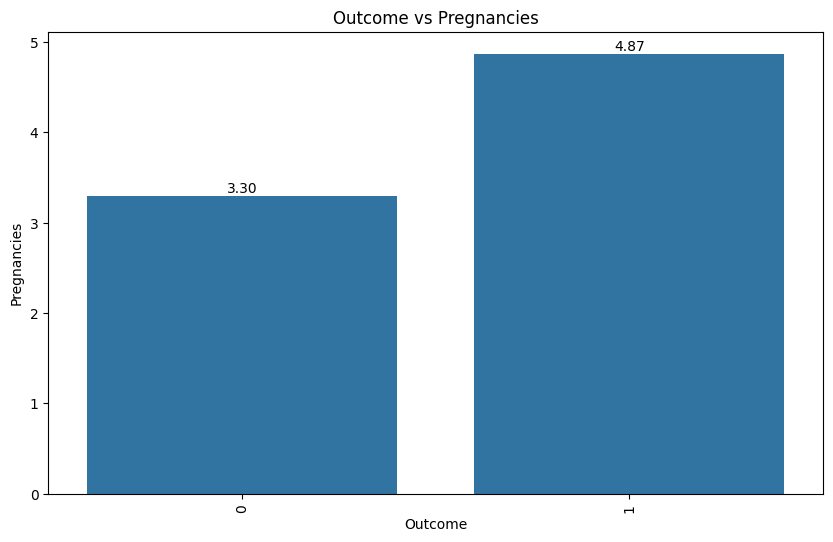

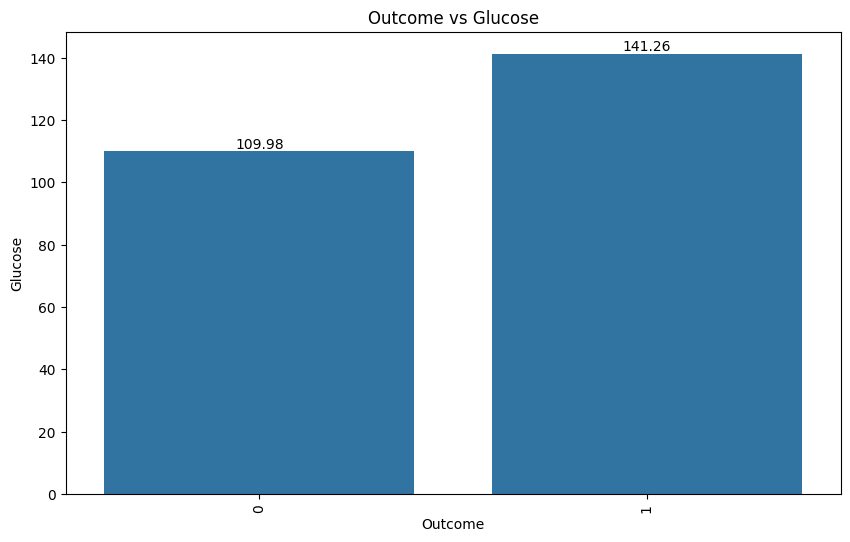

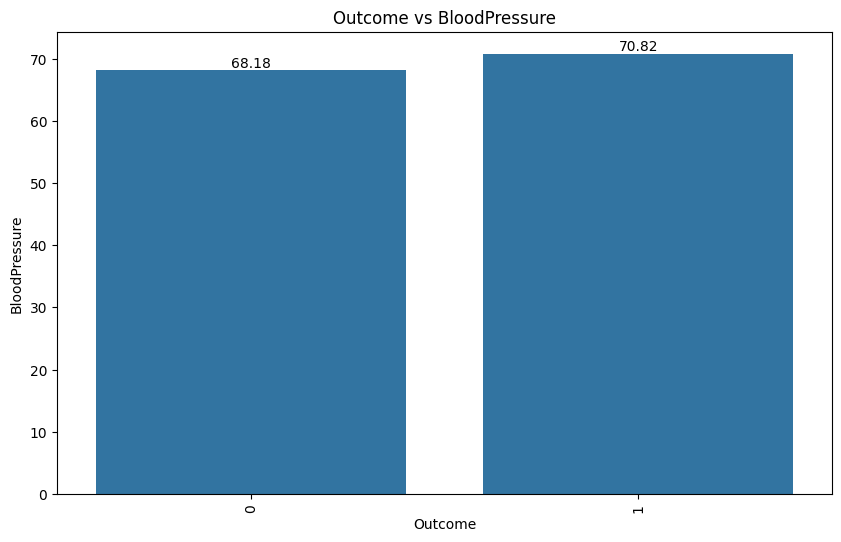

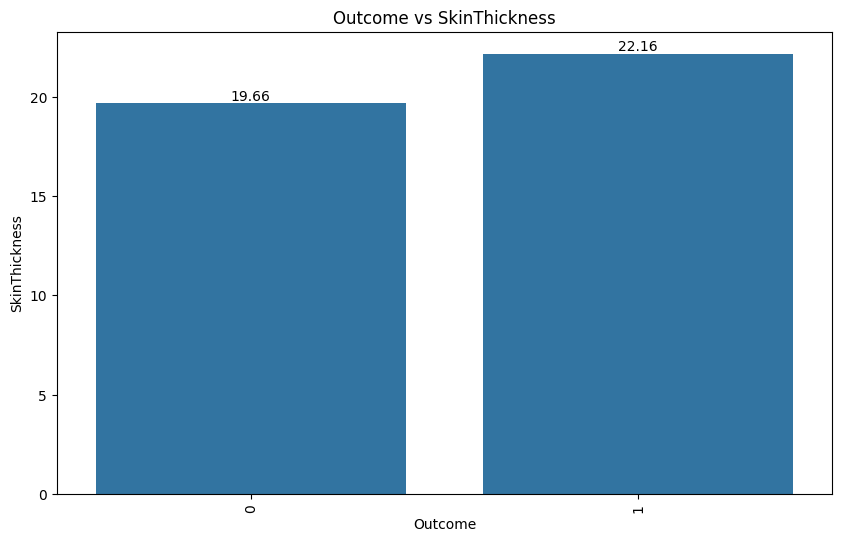

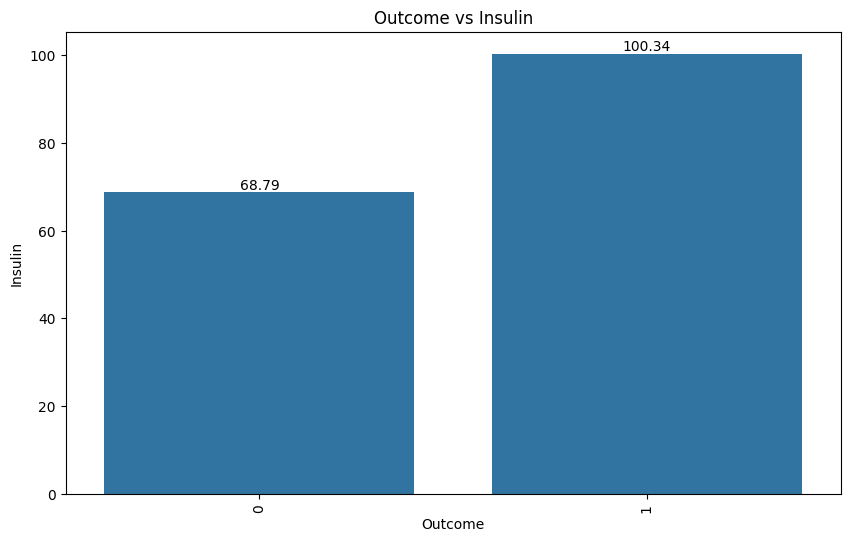

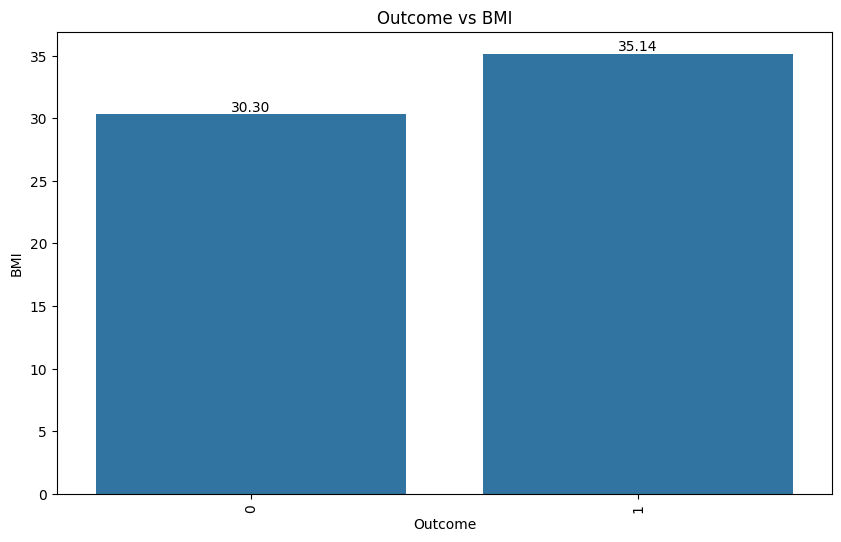

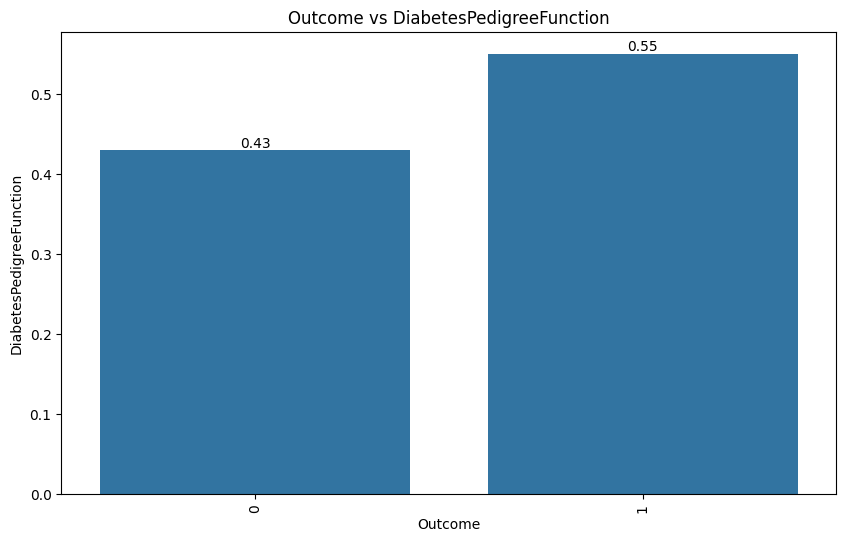

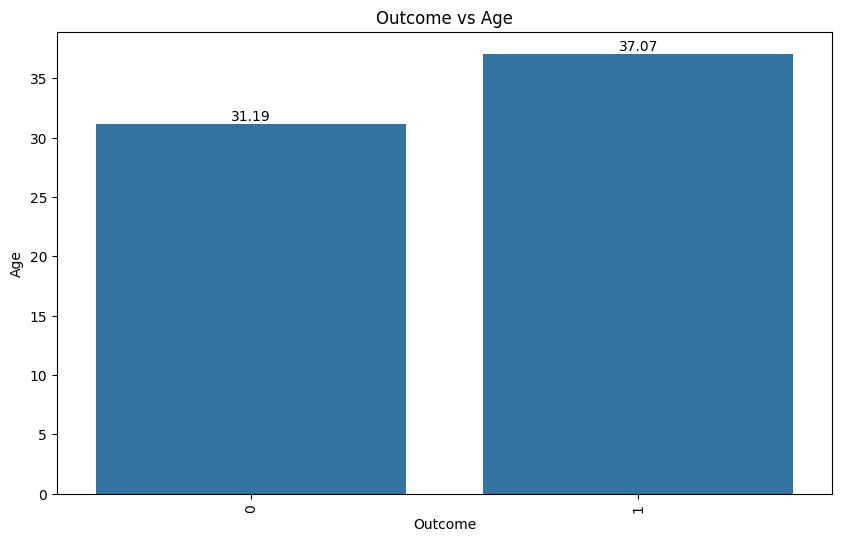

In [30]:
for dis in discrete:
    for cont in continuous:
        plt.figure(figsize=(10, 6))
        ax = sns.barplot(data=df, x=dis, y=cont, ci=None)
        plt.title(f'{dis} vs {cont}')

        for p in ax.patches:
            height = p.get_height()
            ax.annotate(f'{height:.2f}', (p.get_x() + p.get_width() / 2., height),
                        ha='center', va='bottom', fontsize=10, color='black', rotation=0)
        plt.xticks(rotation = 90)
        plt.show()

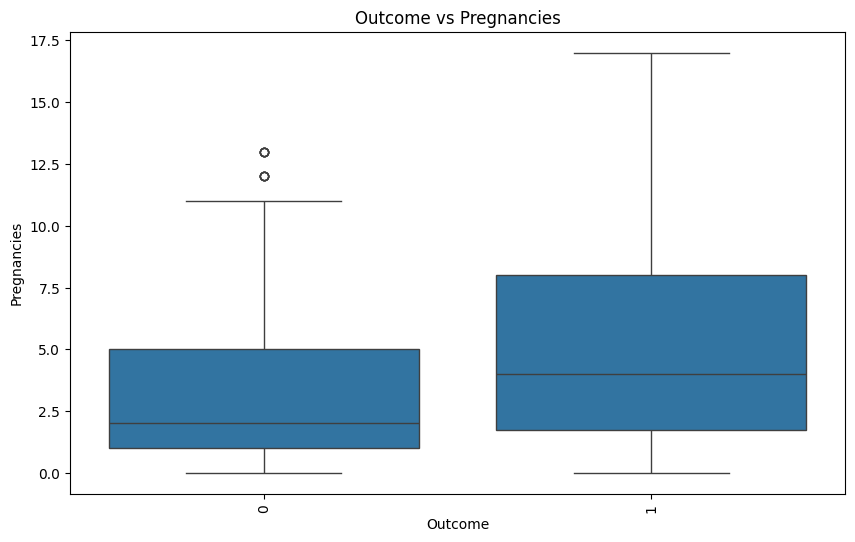

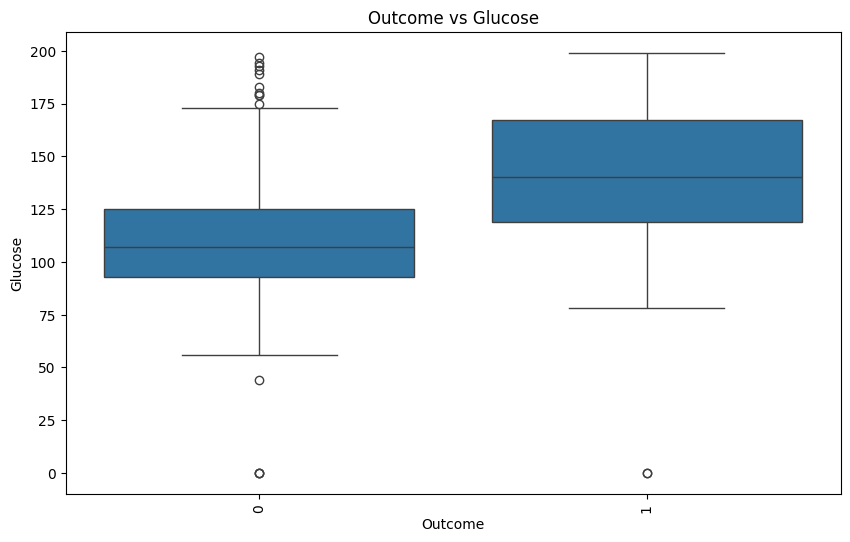

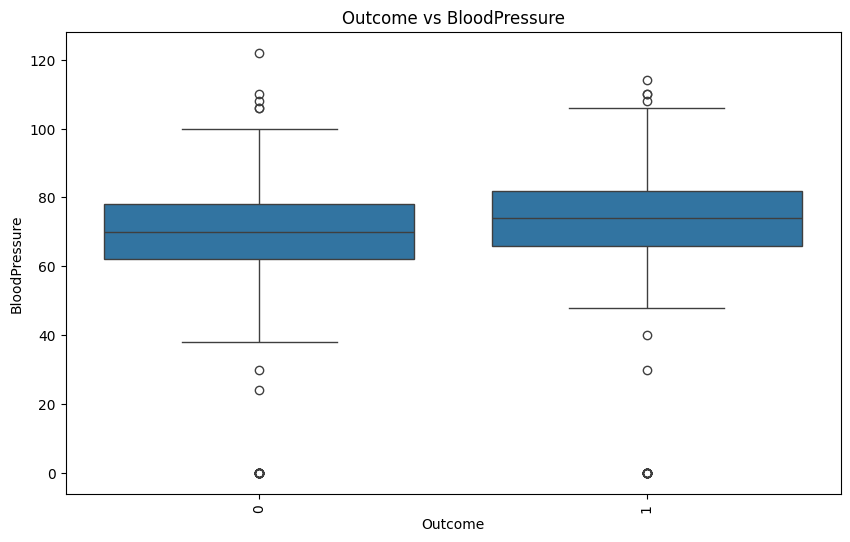

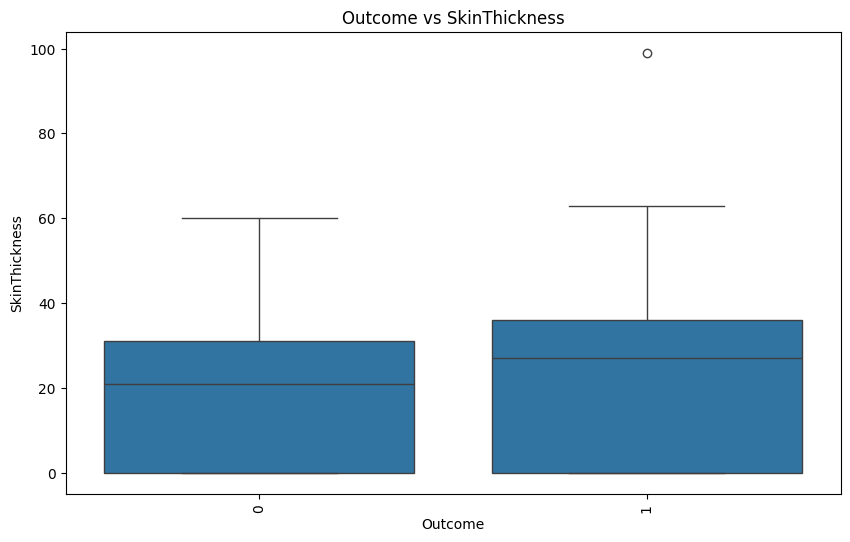

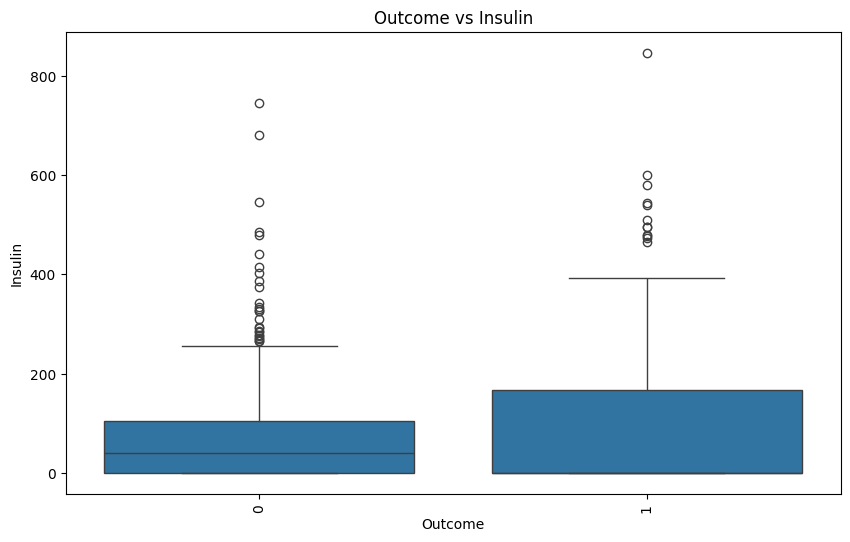

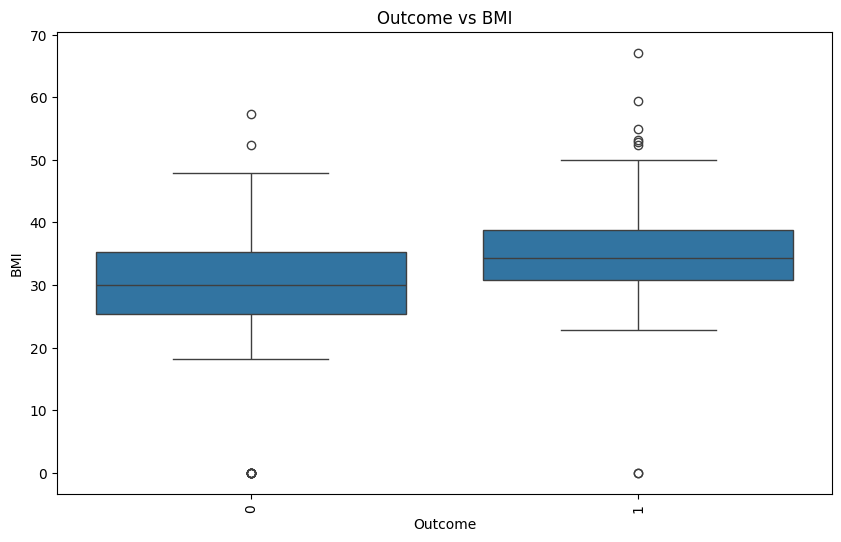

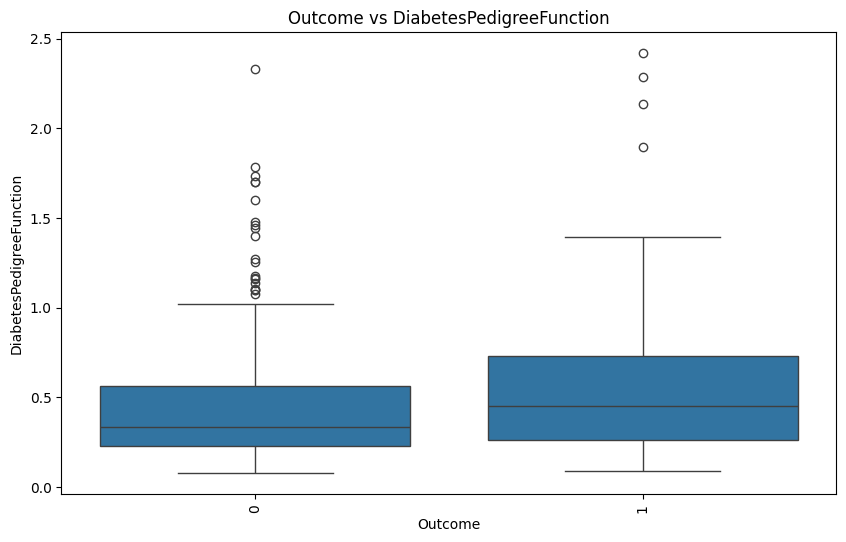

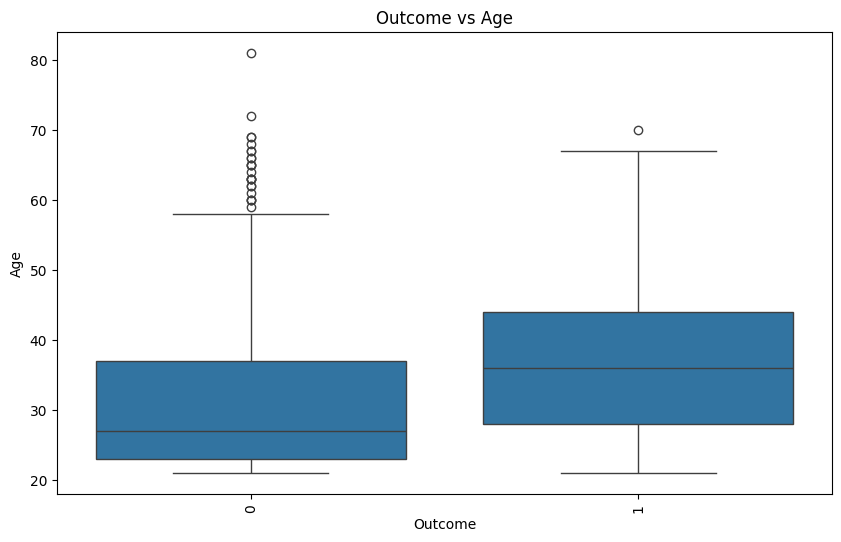

In [31]:
for dis in discrete:
    for cont in continuous:
        plt.figure(figsize=(10, 6))
        ax = sns.boxplot(data=df, x=dis, y=cont)
        plt.title(f'{dis} vs {cont}')
        plt.xticks(rotation = 90)
        plt.show()

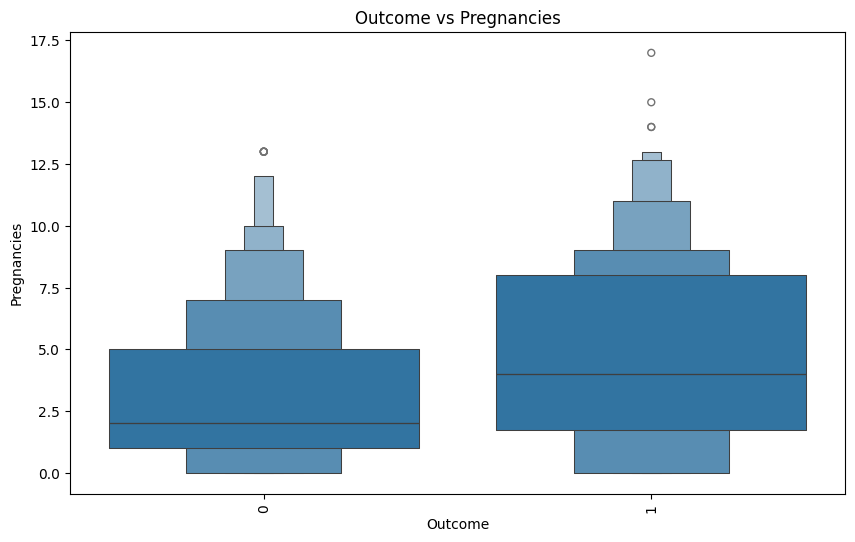

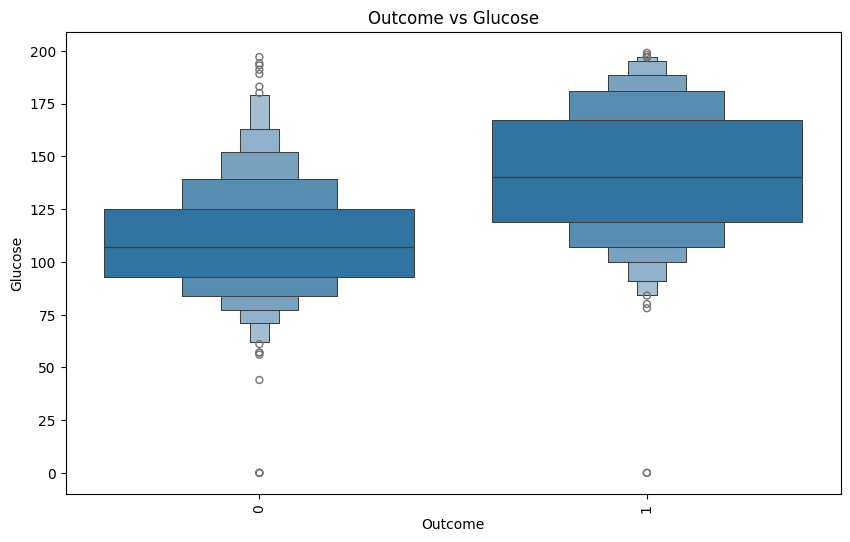

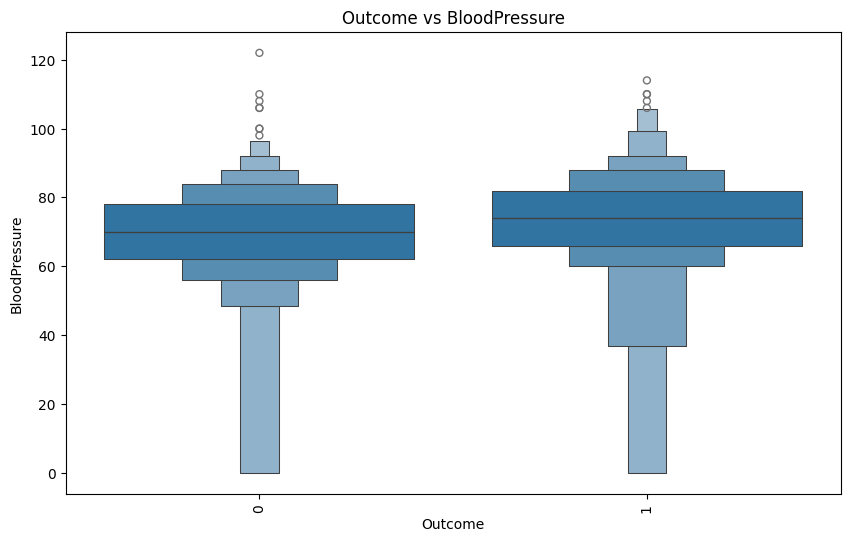

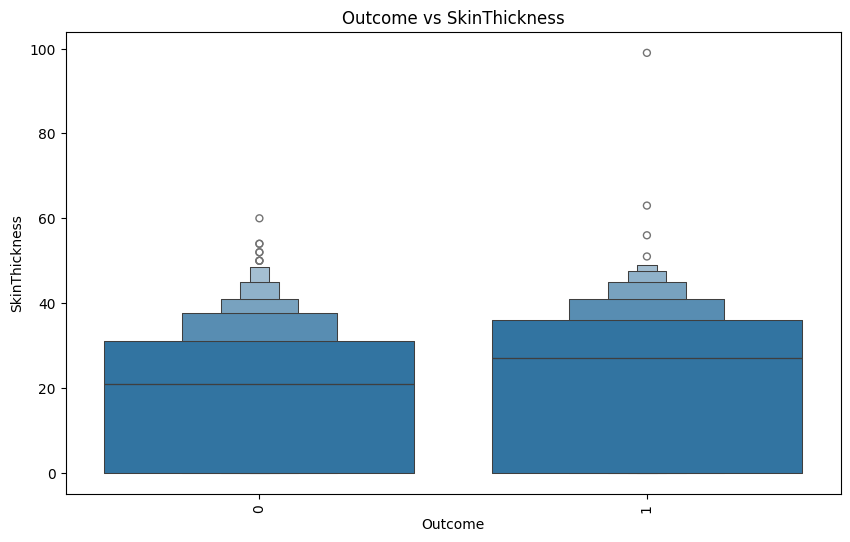

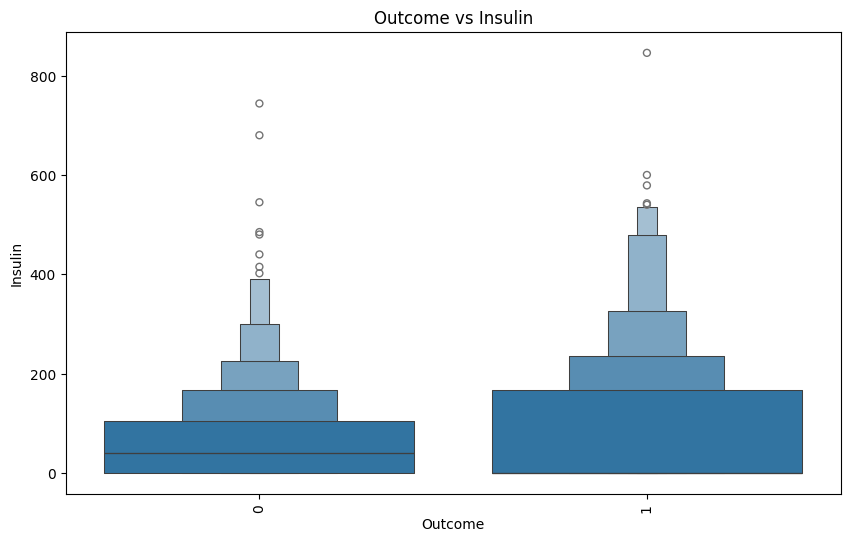

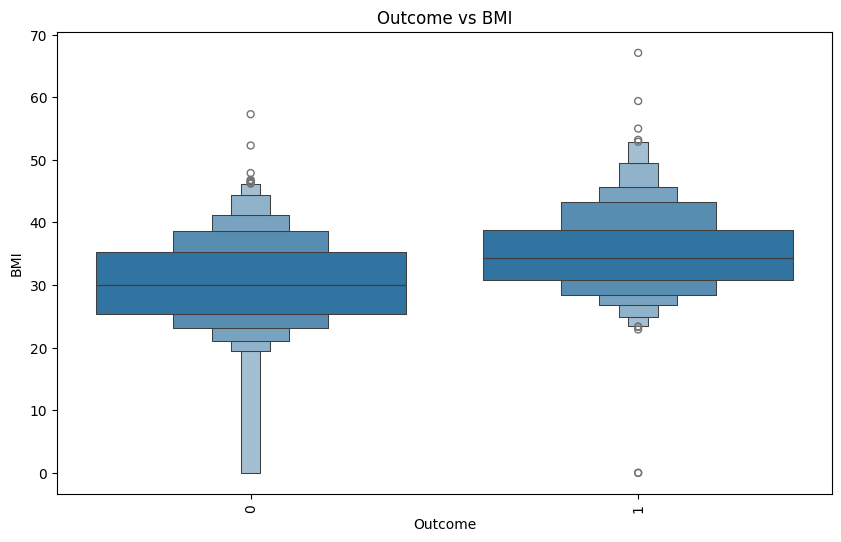

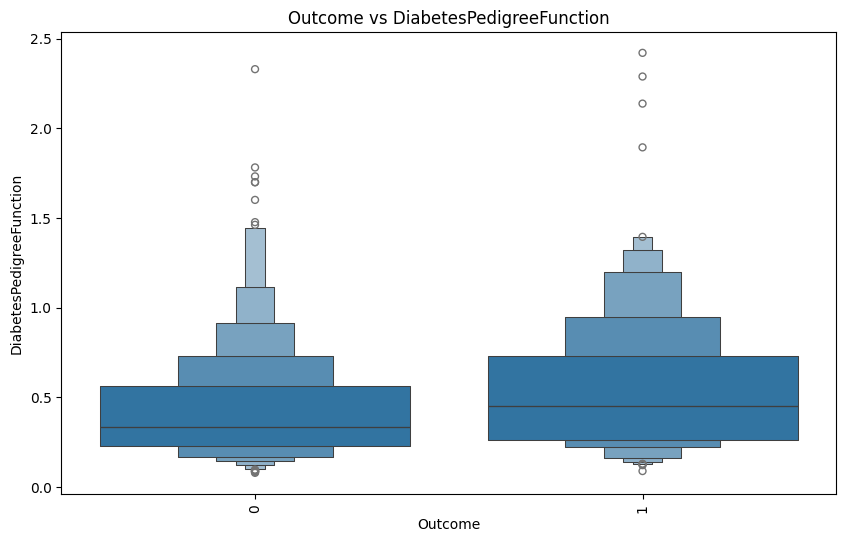

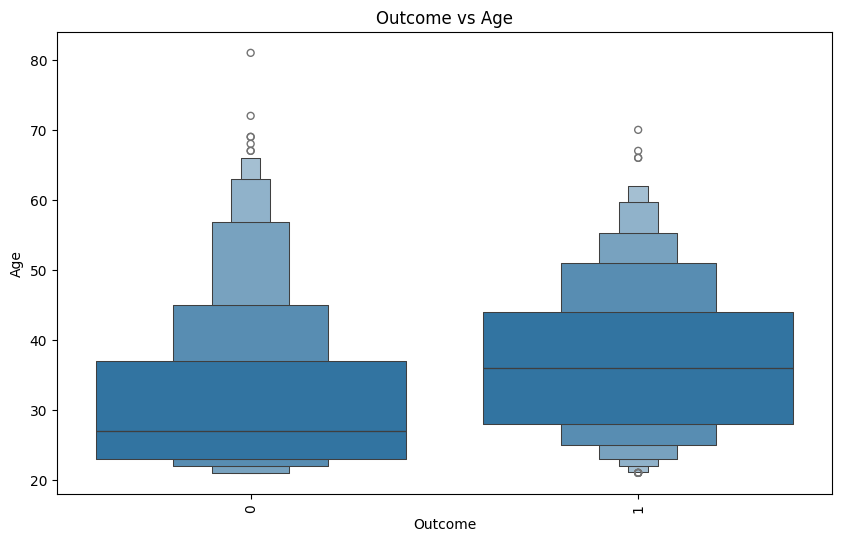

In [32]:
for dis in discrete:
    for cont in continuous:
        plt.figure(figsize=(10, 6))
        ax = sns.boxenplot(data=df, x=dis, y=cont)
        plt.title(f'{dis} vs {cont}')
        plt.xticks(rotation = 90)
        plt.show()

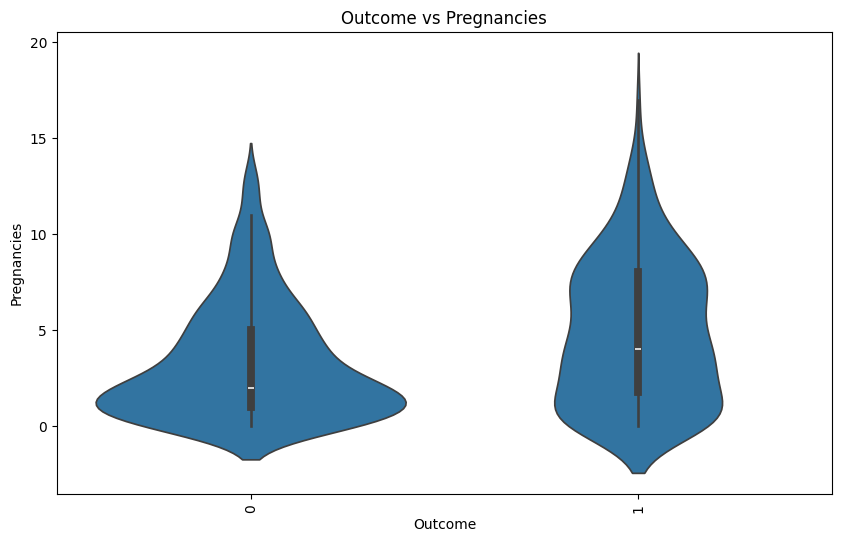

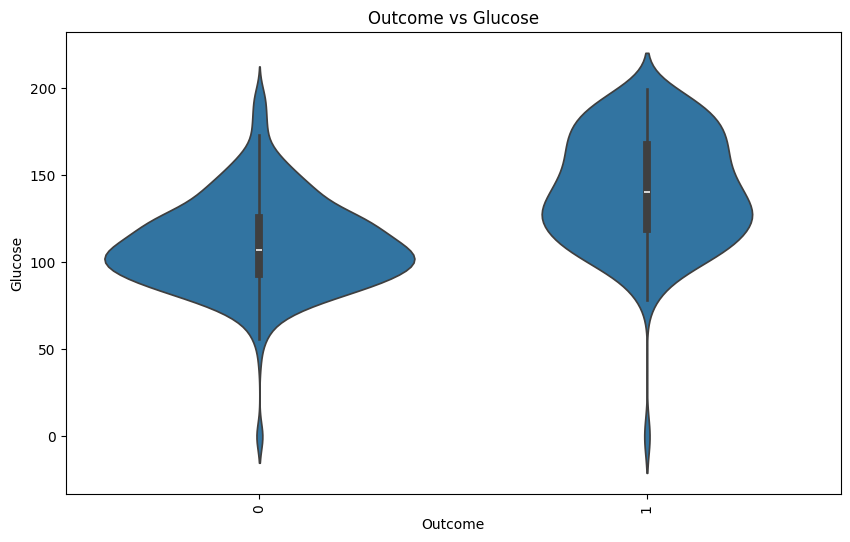

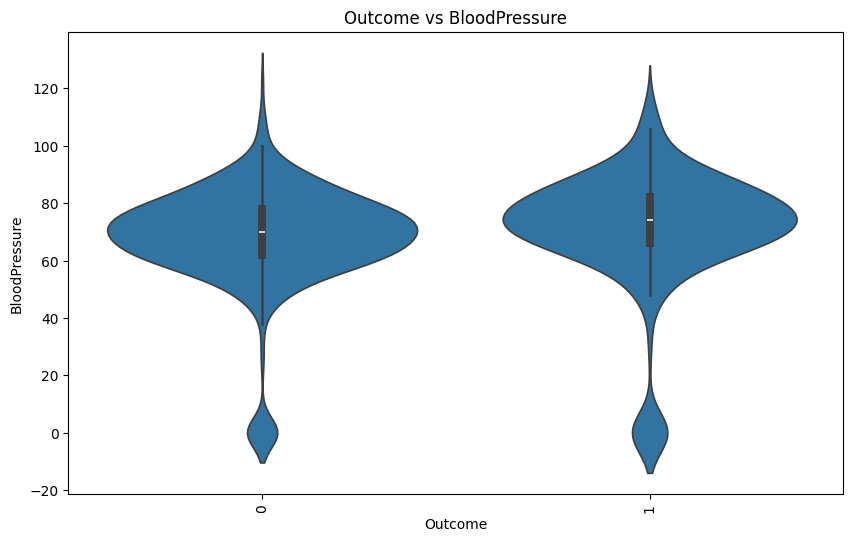

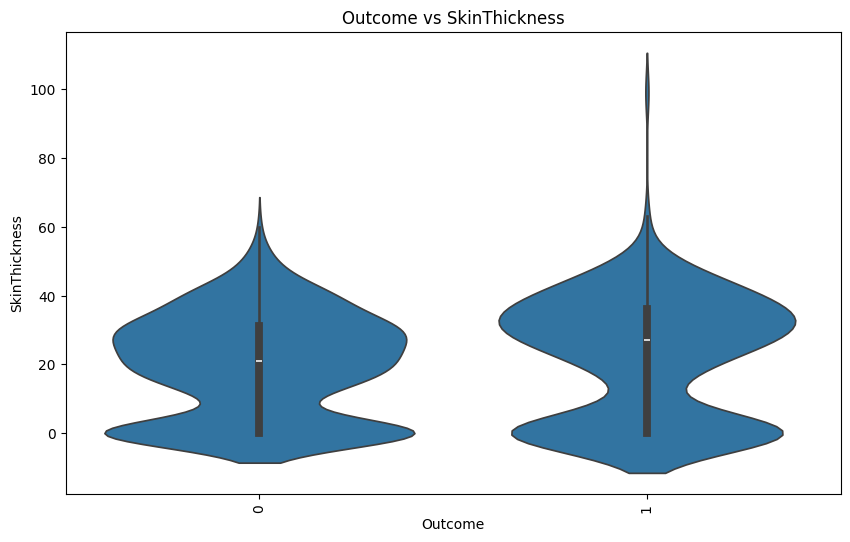

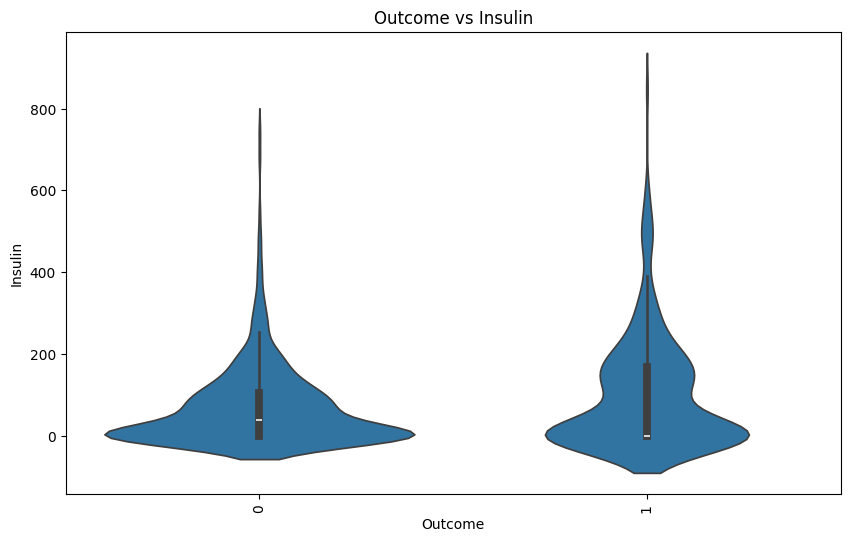

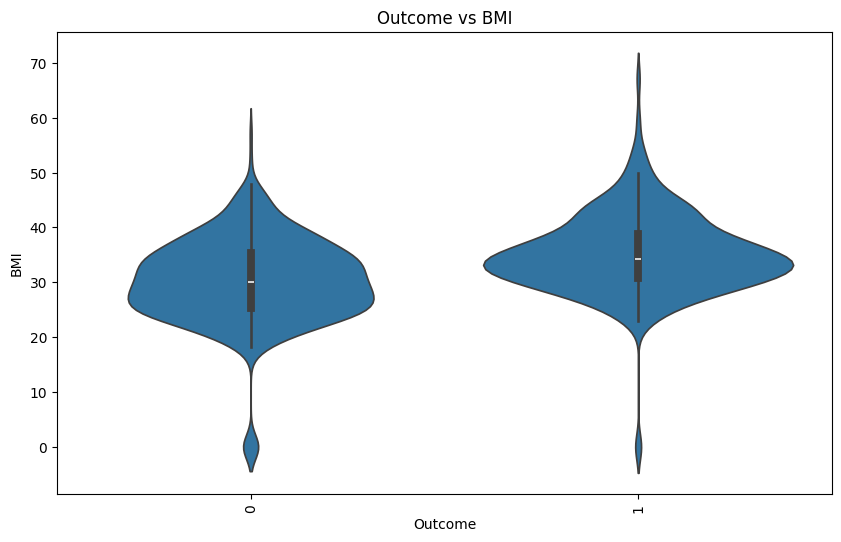

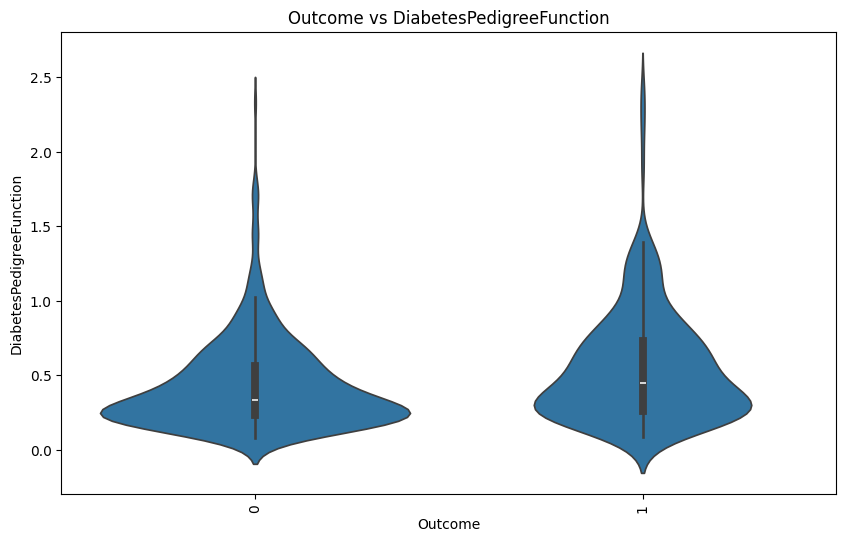

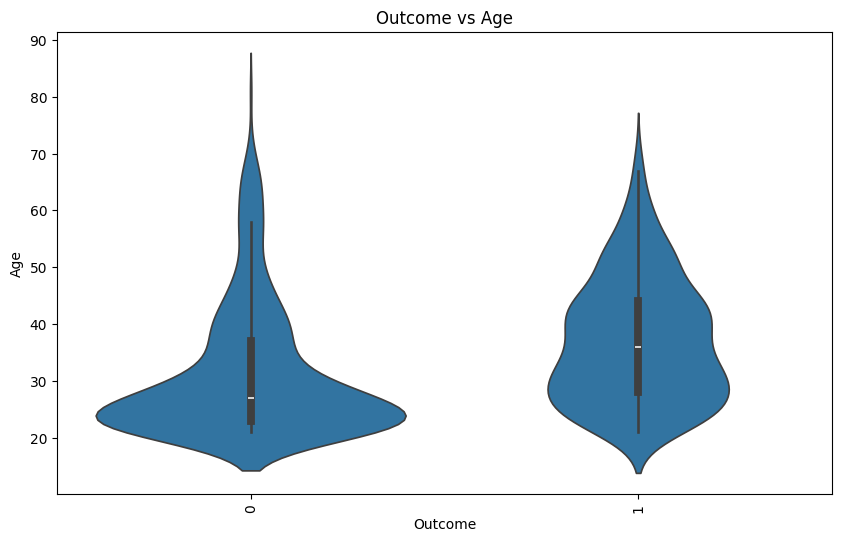

In [33]:
for dis in discrete:
    for cont in continuous:
        plt.figure(figsize=(10, 6))
        ax = sns.violinplot(data=df, x=dis, y=cont)
        plt.title(f'{dis} vs {cont}')
        plt.xticks(rotation = 90)
        plt.show()

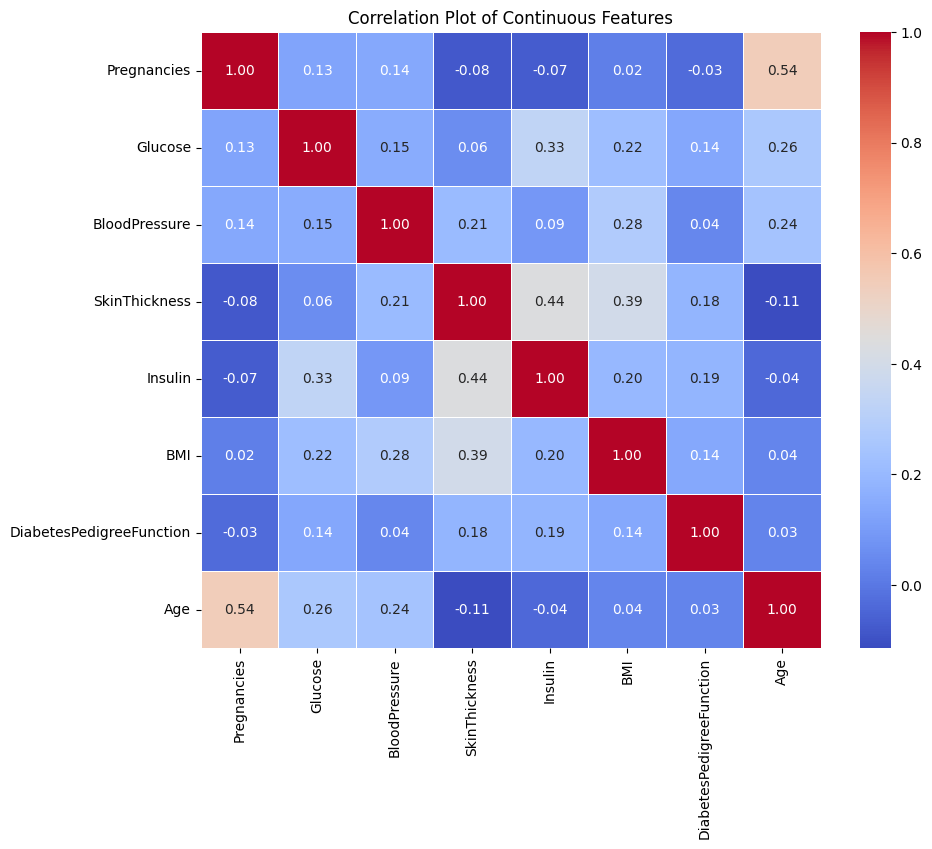

In [34]:
corr_matrix = df[continuous].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Plot of Continuous Features')
plt.show()

In [35]:
corr_matrix

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
Pregnancies,1.000000,0.129459,0.141282,-0.081672,-0.073535,0.017683,-0.033523,0.544341
Glucose,0.129459,1.000000,0.152590,0.057328,0.331357,0.221071,0.137337,0.263514
BloodPressure,0.141282,0.152590,1.000000,0.207371,0.088933,0.281805,0.041265,0.239528
SkinThickness,-0.081672,0.057328,0.207371,1.000000,0.436783,0.392573,0.183928,-0.113970
Insulin,-0.073535,0.331357,0.088933,0.436783,1.000000,0.197859,0.185071,-0.042163
BMI,0.017683,0.221071,0.281805,0.392573,0.197859,1.000000,0.140647,0.036242
DiabetesPedigreeFunction,-0.033523,0.137337,0.041265,0.183928,0.185071,0.140647,1.000000,0.033561
Age,0.544341,0.263514,0.239528,-0.113970,-0.042163,0.036242,0.033561,1.000000


In [36]:
threshold = 0.7
features_to_drop = []
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > threshold:
            colname = corr_matrix.columns[i]
            if colname not in features_to_drop:
                features_to_drop.append(colname)


In [37]:
features_to_drop

[]

In [38]:
def bmi_category(bmi):
    if bmi <= 18.5:
        return 'Underweight'
    elif 18.5 < bmi <= 24.9:
        return 'Healthy'
    elif 25 <= bmi <= 29.9:
        return 'Pre-obese'
    elif 30 <= bmi <= 34.9:
        return 'Obesity class 1'
    elif 35 <= bmi <= 39.9:
        return 'Obesity class 2'
    else:
        return 'Obesity class 3'

In [39]:
df['BMI_Category'] = df['BMI'].apply(bmi_category)

In [40]:
def insulin_category(insulin):
    if insulin < 25:
        return 'Fasting or 3+ hours after glucose ingestion'
    elif 30 <= insulin <= 230:
        return '30 minutes after glucose administration'
    elif 18 <= insulin <= 276:
        return '1 hour after glucose ingestion'
    elif 16 <= insulin <= 166:
        return '2 hours after glucose ingestion'
    else:
        return 'Other'

In [41]:
df['Insulin_Category'] = df['Insulin'].apply(insulin_category)

In [42]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,BMI_Category,Insulin_Category
0,6,148,72,35,0,33.6,0.627,50,1,Obesity class 1,Fasting or 3+ hours after glucose ingestion
1,1,85,66,29,0,26.6,0.351,31,0,Pre-obese,Fasting or 3+ hours after glucose ingestion
2,8,183,64,0,0,23.3,0.672,32,1,Healthy,Fasting or 3+ hours after glucose ingestion
3,1,89,66,23,94,28.1,0.167,21,0,Pre-obese,30 minutes after glucose administration
4,0,137,40,35,168,43.1,2.288,33,1,Obesity class 3,30 minutes after glucose administration
...,...,...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0,Obesity class 1,30 minutes after glucose administration
764,2,122,70,27,0,36.8,0.340,27,0,Obesity class 2,Fasting or 3+ hours after glucose ingestion
765,5,121,72,23,112,26.2,0.245,30,0,Pre-obese,30 minutes after glucose administration
766,1,126,60,0,0,30.1,0.349,47,1,Obesity class 1,Fasting or 3+ hours after glucose ingestion


In [43]:
object_columns = df.select_dtypes(include=['object']).columns
print("Object type columns:")
print(object_columns)

numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
print("\nNumerical type columns:")
print(numerical_columns)

Object type columns:
Index(['BMI_Category', 'Insulin_Category'], dtype='object')

Numerical type columns:
Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')


In [44]:
df_new = pd.get_dummies(df, columns=['BMI_Category', 'Insulin_Category'])

In [45]:
numerical_columns_1 = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction', 'Age']

In [46]:
pivot_table = pd.pivot_table(df_new, values='Glucose', index='Outcome', aggfunc='mean')
pivot_table

,Glucose
Outcome,
0,109.980000
1,141.257463


In [47]:
pivot_table = pd.pivot_table(df_new, values=['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction', 'Age'], index='Outcome', aggfunc='mean')
pivot_table

,Age,BMI,BloodPressure,DiabetesPedigreeFunction,Glucose,Insulin,SkinThickness
Outcome,,,,,,,
0,31.190000,30.304200,68.184000,0.429734,109.980000,68.792000,19.664000
1,37.067164,35.142537,70.824627,0.550500,141.257463,100.335821,22.164179


In [48]:
from sklearn.preprocessing import StandardScaler

In [49]:
scaler = StandardScaler()
df_new[numerical_columns_1] = scaler.fit_transform(df_new[numerical_columns_1])

In [50]:
X = df_new.drop(['Outcome'], axis = 1)
y = df_new['Outcome']

In [51]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

In [52]:
from imblearn.over_sampling import SMOTE

In [53]:
sm = SMOTE()

In [54]:
X_train, y_train = sm.fit_resample(X_train, y_train)

In [55]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression()

In [56]:
y_pred = model.predict(X_test)

In [57]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-score: {:.2f}".format(f1))

Accuracy: 0.79
Precision: 0.71
Recall: 0.70
F1-score: 0.71


In [58]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)

Confusion matrix:
[[101  20]
 [ 21  50]]


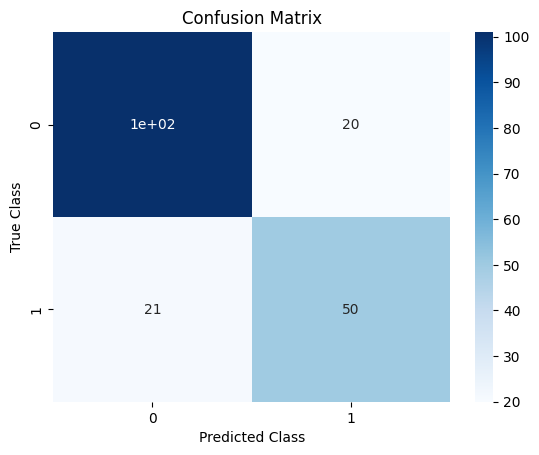

In [59]:
sns.heatmap(cm, annot=True, cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()

In [60]:
report = classification_report(y_test, y_pred)
print("Classification report:")
print(report)

Classification report:
              precision    recall  f1-score   support

           0       0.83      0.83      0.83       121
           1       0.71      0.70      0.71        71

    accuracy                           0.79       192
   macro avg       0.77      0.77      0.77       192
weighted avg       0.79      0.79      0.79       192



In [61]:
from sklearn.tree import DecisionTreeClassifier

In [62]:
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)

DecisionTreeClassifier()

In [63]:
y_pred = clf.predict(X_test)

In [64]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-score: {:.2f}".format(f1))

Accuracy: 0.69
Precision: 0.57
Recall: 0.65
F1-score: 0.61


In [65]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)

Confusion matrix:
[[87 34]
 [25 46]]


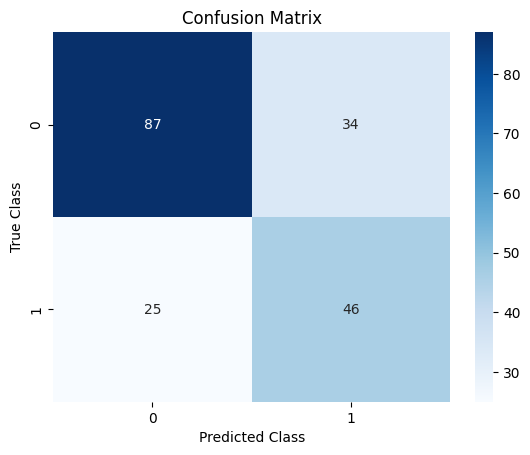

In [66]:
sns.heatmap(cm, annot=True, cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()

In [67]:
report = classification_report(y_test, y_pred)
print("Classification report:")
print(report)

Classification report:
              precision    recall  f1-score   support

           0       0.78      0.72      0.75       121
           1       0.57      0.65      0.61        71

    accuracy                           0.69       192
   macro avg       0.68      0.68      0.68       192
weighted avg       0.70      0.69      0.70       192



In [68]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=100)
rf.fit(X_train, y_train)

RandomForestClassifier()

In [69]:
y_pred = rf.predict(X_test)

In [70]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-score: {:.2f}".format(f1))

Accuracy: 0.76
Precision: 0.68
Recall: 0.68
F1-score: 0.68


In [71]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)

Confusion matrix:
[[98 23]
 [23 48]]


In [72]:
sns.heatmap(cm, annot=True, cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()

In [73]:
report = classification_report(y_test, y_pred)
print("Classification report:")
print(report)

Classification report:
              precision    recall  f1-score   support

           0       0.81      0.81      0.81       121
           1       0.68      0.68      0.68        71

    accuracy                           0.76       192
   macro avg       0.74      0.74      0.74       192
weighted avg       0.76      0.76      0.76       192



In [74]:
from sklearn.svm import SVC
sv = SVC(kernel='linear')
sv.fit(X_train, y_train)
y_pred = sv.predict(X_test)

In [75]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-score: {:.2f}".format(f1))

Accuracy: 0.80
Precision: 0.73
Recall: 0.75
F1-score: 0.74


In [76]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)

Confusion matrix:
[[101  20]
 [ 18  53]]


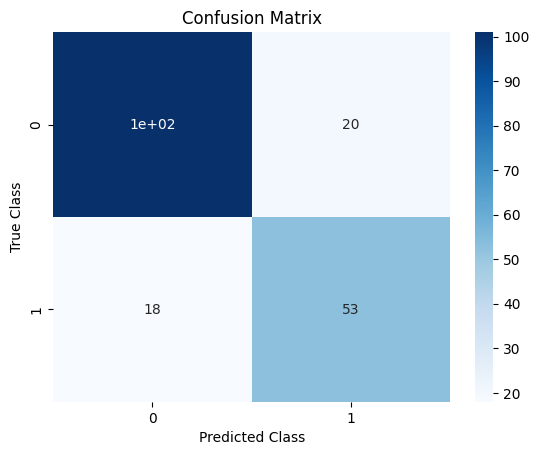

In [77]:
sns.heatmap(cm, annot=True, cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()

In [78]:
report = classification_report(y_test, y_pred)
print("Classification report:")
print(report)

Classification report:
              precision    recall  f1-score   support

           0       0.85      0.83      0.84       121
           1       0.73      0.75      0.74        71

    accuracy                           0.80       192
   macro avg       0.79      0.79      0.79       192
weighted avg       0.80      0.80      0.80       192



In [79]:
from sklearn.ensemble import GradientBoostingClassifier
gbc = GradientBoostingClassifier()
gbc.fit(X_train, y_train)

GradientBoostingClassifier()

In [80]:
y_pred = gbc.predict(X_test)

In [81]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-score: {:.2f}".format(f1))

Accuracy: 0.77
Precision: 0.69
Recall: 0.69
F1-score: 0.69


In [82]:
import pickle

In [83]:
model_filename = 'logistic_model.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(model, file)

print(f"Model saved to {model_filename}")

Model saved to logistic_model.pkl


In [84]:
model_filename = 'svm_model_diabetes.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(sv, file)

print(f"Model saved to {model_filename}")

Model saved to svm_model_diabetes.pkl


In [88]:
from google.colab import files
files.download('svm_model_diabetes.pkl')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [86]:
!pip install streamlit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 27.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 35.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.0/83.0 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 3.3 MB/s eta 0:00:00


In [87]:
import sklearn
import pickle
import streamlit as st
import pandas as pd

def get_pickle_version():
    return pickle.__name__ + " (builtin module)"
#Get Versions
streamlit_version = st.__version__
pandas_version = pd.__version__
sklearn_version = sklearn.__version__

# print the versions
print(f"Streamlit version: {streamlit_version}")
print(f"Pandas version: {pandas_version}")
print(f"Scikit-learn version: {sklearn_version}")
print(f"Pickle version: {get_pickle_version()}")

Streamlit version: 1.37.0
Pandas version: 2.1.4
Scikit-learn version: 1.3.2
Pickle version: pickle (builtin module)
